
# Project

#### The purpose of the project is to determine whether given set of variables can be be used as a predictor in the probability of default modeling.I've appended readily available data-set of loans issued by one of the P2P lending operator in US with recourse and non-recourse states classification to determine whether those variables combined have any reliable predictive power. Well established weight of evidence concepts was used to shortlist variables before proceeding with logistic regression model


# Data 

#### I decided to compile two data sets: Lending Club Loan Data available at https://www.kaggle.com/wendykan/lending-club-loan-data  with own elaboration of US recourse/non-recourse states classification as determined by Ghent and Kudlyak in Ghent, Andra C. and Kudlyak, Marianna, Recourse and Residential Mortgage Default: Evidence from U.S. States (February 25, 2011). Federal Reserve Bank of Richmond Working Paper No. 09-10R. Available at SSRN: https://ssrn.com/abstract=1432437 or http://dx.doi.org/10.2139/ssrn.1432437

# Conclusions

#### Recourse and non-recourse classification of the geographical location of any particular loan origination turned out to have very limited predictive power. The overall real life model usability is relatively low with AUCROC of just short of 70%.¶

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_curve, roc_auc_score

In [2]:
jin = pd.read_csv('loan_data_2007_2014.csv')

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning:

Columns (20) have mixed types. Specify dtype option on import or set low_memory=False.



In [3]:
data = jin.copy()

pd.options.display.max_columns = None
data.head(1)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.0,861.07,0.0,0.0,0.0,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
data.columns

Index(['Unnamed: 0', 'id', 'member_id', 'loan_amnt', 'funded_amnt',
       'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade',
       'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url',
       'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'mths_since_last_major_derog',
       'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint',
       'verificatio

In [5]:
data.columns.values

array(['Unnamed: 0', 'id', 'member_id', 'loan_amnt', 'funded_amnt',
       'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade',
       'sub_grade', 'emp_title', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status',
       'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'collection_recovery_fee', 'last_pymnt_d',
       'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'mths_since_last_major_derog',
       'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint',
       'veri

In [6]:
type(data.columns.values)

numpy.ndarray

In [7]:
type(data.columns)

pandas.core.indexes.base.Index

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 75 columns):
Unnamed: 0                     466285 non-null int64
id                             466285 non-null int64
member_id                      466285 non-null int64
loan_amnt                      466285 non-null int64
funded_amnt                    466285 non-null int64
funded_amnt_inv                466285 non-null float64
term                           466285 non-null object
int_rate                       466285 non-null float64
installment                    466285 non-null float64
grade                          466285 non-null object
sub_grade                      466285 non-null object
emp_title                      438697 non-null object
emp_length                     445277 non-null object
home_ownership                 466285 non-null object
annual_inc                     466281 non-null float64
verification_status            466285 non-null object
issue_d                   

In [9]:
data.describe()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
count,466285.000000,4.662850e+05,4.662850e+05,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,4.662810e+05,466285.000000,466256.000000,466256.000000,215934.000000,62638.000000,466256.000000,466256.000000,4.662850e+05,465945.000000,466256.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466285.000000,466140.000000,98974.000000,466285.0,0.0,0.0,0.0,466256.000000,3.960090e+05,3.960090e+05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.960090e+05,0.0,0.0,0.0
mean,233142.000000,1.307973e+07,1.459766e+07,14317.277577,14291.801044,14222.329888,13.829236,432.061201,7.327738e+04,17.218758,0.284678,0.804745,34.104430,74.306012,11.187069,0.160564,1.623020e+04,56.176947,25.064430,4410.062342,4408.452258,11540.686220,11469.892747,8866.014657,2588.677225,0.650129,85.344211,8.961534,3123.913796,0.009085,42.852547,1.0,NaN,NaN,NaN,0.004002,1.919135e+02,1.388017e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.037909e+04,NaN,NaN,NaN
std,134605.029472,1.089371e+07,1.168237e+07,8286.509164,8274.371300,8297.637788,4.357587,243.485550,5.496357e+04,7.851121,0.797365,1.091598,21.778487,30.357653,4.987526,0.510863,2.067625e+04,23.732628,11.600141,6355.078769,6353.198001,8265.627112,8254.157579,7031.687997,2483.809661,5.265730,552.216084,85.491437,5554.737393,0.108648,21.662591,0.0,NaN,NaN,NaN,0.068637,1.463021e+04,1.521147e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.724713e+04,NaN,NaN,NaN
min,0.000000,5.473400e+04,7.047300e+04,500.000000,500.000000,0.000000,5.420000,15.670000,1.896000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,NaN,NaN,NaN,0.000000,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN
25%,116571.000000,3.639987e+06,4.379705e+06,8000.000000,8000.000000,8000.000000,10.990000,256.690000,4.500000e+04,11.360000,0.000000,0.000000,16.000000,53.000000,8.000000,0.000000,6.413000e+03,39.200000,17.000000,0.000000,0.000000,5552.125349,5499.250000,3708.560000,957.280000,0.000000,0.000000,0.000000,312.620000,0.000000,26.000000,1.0,NaN,NaN,NaN,0.000000,0.000000e+00,2.861800e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.350000e+04,NaN,NaN,NaN
50%,233142.000000,1.010790e+07,1.194108e+07,12000.000000,12000.000000,12000.000000,13.660000,379.890000,6.300000e+04,16.870000,0.000000,0.000000,31.000000,76.000000,10.000000,0.000000,1.176400e+04,57.600000,23.000000,441.470000,441.380000,9419.250943,9355.430000,6817.760000,1818.880000,0.000000,0.000000,0.000000,545.960000,0.000000,42.000000,1.0,NaN,NaN,NaN,0.000000,0.000000e+00,8.153900e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.280000e+04,NaN,NaN,NaN
75%,349713.000000,2.073121e+07,2.300154e+07,20000.000000,20000.000000,19950.000000,16.490000,566.580000,8.896000e+04,22.780000,0.000000,1.000000,49.000000,102.000000,14.000000,0.000000,2.033300e+04,74.700000,32.000000,7341.650000,7338.390000,15308.158460,15231.310000,12000.000000,3304.530000,0.000000,0.000000,0.000000,3187.510000,0.000000,59.000000,1.0,NaN,NaN,NaN,0.000000,0.000000e+00,2.089530e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [10]:
t = data.loc[:,'emp_length']
tt= pd.DataFrame(t)
t.unique()

array(['10+ years', '< 1 year', '1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '6 years', '2 years', '7 years', nan],
      dtype=object)

In [11]:
data['emp_length'].unique()

array(['10+ years', '< 1 year', '1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '6 years', '2 years', '7 years', nan],
      dtype=object)

In [12]:
data['emp_length_int'] = data['emp_length'].str.replace('\+ years', '')
data['emp_length_int'] = data['emp_length_int'].str.replace('< 1 year',str(0))
data['emp_length_int'] = data['emp_length_int'].str.replace('n/a',str(0))
data['emp_length_int'] = data['emp_length_int'].str.replace('years','')
data['emp_length_int'] = data['emp_length_int'].str.replace('year','')

In [13]:
data['emp_length_int'].unique()

array(['10', '0', '1 ', '3 ', '8 ', '9 ', '4 ', '5 ', '6 ', '2 ', '7 ',
       nan], dtype=object)

In [14]:
type(data['emp_length_int'][0])

str

In [15]:
data['emp_length_int'] = pd.to_numeric(data['emp_length_int'])
type(data['emp_length_int'][0])

numpy.float64

In [16]:
data['earliest_cr_line'].unique()

array(['Jan-85', 'Apr-99', 'Nov-01', 'Feb-96', 'Jan-96', 'Nov-04',
       'Jul-05', 'Jan-07', 'Apr-04', 'Sep-04', 'Jan-98', 'Oct-89',
       'Jul-03', 'May-91', 'Sep-07', 'Oct-98', 'Aug-93', 'Oct-03',
       'Jan-01', 'Nov-97', 'Feb-83', 'Jul-85', 'Apr-03', 'Jun-01',
       'Feb-02', 'Aug-84', 'Nov-06', 'Dec-87', 'Nov-81', 'Feb-97',
       'Apr-05', 'Oct-07', 'Dec-00', 'Apr-07', 'Dec-01', 'Jan-03',
       'Mar-94', 'Sep-98', 'Jun-04', 'Nov-95', 'Jul-99', 'Jun-95',
       'Sep-92', 'Jan-02', 'Apr-92', 'Oct-06', 'May-00', 'Dec-98',
       'Dec-04', 'Oct-00', 'May-02', 'May-06', 'Jul-02', 'Jul-06',
       'May-97', 'Oct-05', 'Apr-95', 'Oct-02', 'Jan-00', 'Apr-00',
       'Dec-94', 'Sep-05', 'Dec-84', 'Dec-99', 'Nov-03', 'Jun-89',
       'Jun-03', 'Oct-96', 'May-03', 'Jun-02', 'Jun-07', 'Dec-96',
       'Feb-84', 'Sep-02', 'Jan-86', 'May-98', 'Jan-97', 'Jun-05',
       'Feb-90', 'Mar-04', 'Jul-95', 'Aug-94', 'Jun-92', 'Mar-97',
       'Apr-06', 'Apr-90', 'Aug-99', 'Sep-00', 'Feb-01', 'Dec-

In [17]:
data['earliest_cr_line_date'] = pd.to_datetime(data['earliest_cr_line'], format= '%b-%y')

In [18]:
data['earliest_cr_line_date'].unique()

array(['1985-01-01T00:00:00.000000000', '1999-04-01T00:00:00.000000000',
       '2001-11-01T00:00:00.000000000', '1996-02-01T00:00:00.000000000',
       '1996-01-01T00:00:00.000000000', '2004-11-01T00:00:00.000000000',
       '2005-07-01T00:00:00.000000000', '2007-01-01T00:00:00.000000000',
       '2004-04-01T00:00:00.000000000', '2004-09-01T00:00:00.000000000',
       '1998-01-01T00:00:00.000000000', '1989-10-01T00:00:00.000000000',
       '2003-07-01T00:00:00.000000000', '1991-05-01T00:00:00.000000000',
       '2007-09-01T00:00:00.000000000', '1998-10-01T00:00:00.000000000',
       '1993-08-01T00:00:00.000000000', '2003-10-01T00:00:00.000000000',
       '2001-01-01T00:00:00.000000000', '1997-11-01T00:00:00.000000000',
       '1983-02-01T00:00:00.000000000', '1985-07-01T00:00:00.000000000',
       '2003-04-01T00:00:00.000000000', '2001-06-01T00:00:00.000000000',
       '2002-02-01T00:00:00.000000000', '1984-08-01T00:00:00.000000000',
       '2006-11-01T00:00:00.000000000', '1987-12-01

In [19]:
data['mths_since_earliest_cr_line'] = round(pd.to_numeric((pd.to_datetime('2020-04-01') - data['earliest_cr_line_date'])/ np.timedelta64(1,'M')))


In [20]:
data['mths_since_earliest_cr_line'].describe()

count    466256.000000
mean        267.482430
std          93.974829
min        -584.000000
25%         211.000000
50%         253.000000
75%         313.000000
max         615.000000
Name: mths_since_earliest_cr_line, dtype: float64

In [21]:
data.loc[:, ['earliest_cr_line','earliest_cr_line_date','mths_since_earliest_cr_line']][data['mths_since_earliest_cr_line']<0]

,earliest_cr_line,earliest_cr_line_date,mths_since_earliest_cr_line
1580,Sep-62,2062-09-01,-509.0
1770,Sep-68,2068-09-01,-581.0
2799,Sep-64,2064-09-01,-533.0
3282,Sep-67,2067-09-01,-569.0
3359,Feb-65,2065-02-01,-538.0
3413,Jun-67,2067-06-01,-566.0
3607,Aug-67,2067-08-01,-568.0
3989,Dec-63,2063-12-01,-524.0
4440,Sep-68,2068-09-01,-581.0
4449,Sep-68,2068-09-01,-581.0


In [22]:
data['mths_since_earliest_cr_line'][data['mths_since_earliest_cr_line']<0] = data['mths_since_earliest_cr_line'].max()

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [23]:
data['mths_since_earliest_cr_line'].describe()

count    466256.000000
mean        270.385374
std          86.460310
min         101.000000
25%         212.000000
50%         254.000000
75%         313.000000
max         615.000000
Name: mths_since_earliest_cr_line, dtype: float64

In [24]:
data['addr_state'].unique()

array(['AZ', 'GA', 'IL', 'CA', 'OR', 'NC', 'TX', 'VA', 'MO', 'CT', 'UT',
       'FL', 'NY', 'PA', 'MN', 'NJ', 'KY', 'OH', 'SC', 'RI', 'LA', 'MA',
       'WA', 'WI', 'AL', 'CO', 'KS', 'NV', 'AK', 'MD', 'WV', 'VT', 'MI',
       'DC', 'SD', 'NH', 'AR', 'NM', 'MT', 'HI', 'WY', 'OK', 'DE', 'MS',
       'TN', 'IA', 'NE', 'ID', 'IN', 'ME'], dtype=object)

In [25]:
states = pd.read_csv('States.csv')
type(states)

pandas.core.frame.DataFrame

In [26]:
r_nr = pd.read_csv('REC_NREC.csv')
r_nr.head()

,R_NR
0,recourse
1,non-recourse
2,non-recourse
3,recourse
4,non-recourse


In [27]:
recourse_tbl = pd.concat([states, r_nr], axis =1)

In [28]:
recourse_tbl.head(1)

,STATE,R_NR
0,AL,recourse


In [29]:
data.head(3)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.0,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,1985-01-01,423.0
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.0,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1999-04-01,252.0
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,NaN,2.0,0.0,2956,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.0,0.00,0.00,Jun-14,649.91,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,2001-11-01,221.0


In [30]:
data_2 = pd.merge(left=data, right=recourse_tbl, how= 'left', left_on= 'addr_state', right_on='STATE')

In [31]:
pd.options.display.max_rows = 100

In [32]:
data_2

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR
0,0,1077501,1296599,5000,5000,4975.00000,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.00,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.70,9.0,f,0.00,0.00,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.0000,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,1985-01-01,423.0,AZ,non-recourse
1,1,1077430,1314167,2500,2500,2500.00000,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.00,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.40,4.0,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.1100,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1999-04-01,252.0,GA,recourse
2,2,1077175,1313524,2400,2400,2400.00000,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.00,Not Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,NaN,2.0,0.0,2956,98.50,10.0,f,0.00,0.00,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.0000,Jun-14,649.91,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,2001-11-01,221.0,IL,recourse
3,3,1076863,1277178,10000,10000,10000.00000,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.00,Source Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-96,1.0,35.0,NaN,10.0,0.0,5598,21.00,37.0,f,0.00,0.00,12226.302210,12226.30,10000.00,2209.33,16.97,0.00,0.0000,Jan-15,357.48,NaN,Jan-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,1996-02-01,290.0,CA,non-recourse
4,4,1075358,1311748,3000,3000,3000.00000,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.00,Source Verified,Dec-11,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0,Jan-96,0.0,38.0,NaN,15.0,0.0,27783,53.90,38.0,f,766.90,766.90,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.0000,Jan-16,67.79,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1996-01-01,291.0,OR,non-recourse
5,5,1075269,1311441,5000,5000,5000.00000,36 months,7.90,156.46,A,A4,Veolia Transportaton,3 years,RENT,36000.00,Source Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,wedding,My wedding loan I promise to pay back,852xx,AZ,11

In [33]:
data_2['R_NR'].unique()

array(['non-recourse', 'recourse', nan], dtype=object)

In [34]:
print(data_2['R_NR'][data_2['R_NR']=='recourse'].count())
print(data_2['R_NR'][data_2['R_NR']=='non-recourse'].count())

349501
115358


In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 78 columns):
Unnamed: 0                     466285 non-null int64
id                             466285 non-null int64
member_id                      466285 non-null int64
loan_amnt                      466285 non-null int64
funded_amnt                    466285 non-null int64
funded_amnt_inv                466285 non-null float64
term                           466285 non-null object
int_rate                       466285 non-null float64
installment                    466285 non-null float64
grade                          466285 non-null object
sub_grade                      466285 non-null object
emp_title                      438697 non-null object
emp_length                     445277 non-null object
home_ownership                 466285 non-null object
annual_inc                     466281 non-null float64
verification_status            466285 non-null object
issue_d                   

In [36]:
data_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 466285 entries, 0 to 466284
Data columns (total 80 columns):
Unnamed: 0                     466285 non-null int64
id                             466285 non-null int64
member_id                      466285 non-null int64
loan_amnt                      466285 non-null int64
funded_amnt                    466285 non-null int64
funded_amnt_inv                466285 non-null float64
term                           466285 non-null object
int_rate                       466285 non-null float64
installment                    466285 non-null float64
grade                          466285 non-null object
sub_grade                      466285 non-null object
emp_title                      438697 non-null object
emp_length                     445277 non-null object
home_ownership                 466285 non-null object
annual_inc                     466281 non-null float64
verification_status            466285 non-null object
issue_d                   

In [37]:
data_2['emp_length_int'].unique()

array([10.,  0.,  1.,  3.,  8.,  9.,  4.,  5.,  6.,  2.,  7., nan])

In [38]:
data_2['term'].unique()

array([' 36 months', ' 60 months'], dtype=object)

In [39]:
data_2['term_int'] = data_2['term'].str.replace('months','')

In [40]:
data_2['term_int'].unique()

array([' 36 ', ' 60 '], dtype=object)

In [41]:
data_2['term_int'] = pd.to_numeric(data_2['term_int'])

In [42]:
data_2['issue_d'].unique()

array(['Dec-11', 'Nov-11', 'Oct-11', 'Sep-11', 'Aug-11', 'Jul-11',
       'Jun-11', 'May-11', 'Apr-11', 'Mar-11', 'Feb-11', 'Jan-11',
       'Dec-10', 'Nov-10', 'Oct-10', 'Sep-10', 'Aug-10', 'Jul-10',
       'Jun-10', 'May-10', 'Apr-10', 'Mar-10', 'Feb-10', 'Jan-10',
       'Dec-09', 'Nov-09', 'Oct-09', 'Sep-09', 'Aug-09', 'Jul-09',
       'Jun-09', 'May-09', 'Apr-09', 'Mar-09', 'Feb-09', 'Jan-09',
       'Dec-08', 'Nov-08', 'Oct-08', 'Sep-08', 'Aug-08', 'Jul-08',
       'Jun-08', 'May-08', 'Apr-08', 'Mar-08', 'Feb-08', 'Jan-08',
       'Dec-07', 'Nov-07', 'Oct-07', 'Sep-07', 'Aug-07', 'Jul-07',
       'Jun-07', 'Dec-13', 'Nov-13', 'Oct-13', 'Sep-13', 'Aug-13',
       'Jul-13', 'Jun-13', 'May-13', 'Apr-13', 'Mar-13', 'Feb-13',
       'Jan-13', 'Dec-12', 'Nov-12', 'Oct-12', 'Sep-12', 'Aug-12',
       'Jul-12', 'Jun-12', 'May-12', 'Apr-12', 'Mar-12', 'Feb-12',
       'Jan-12', 'Dec-14', 'Nov-14', 'Oct-14', 'Sep-14', 'Aug-14',
       'Jul-14', 'Jun-14', 'May-14', 'Apr-14', 'Mar-14', 'Feb-

In [43]:
data_2['issue_d_date'] = pd.to_datetime(data_2['issue_d'], format='%b-%y')
data_2['mths_since_issue_d']=round((pd.to_datetime('2020-04-01') - data_2['issue_d_date'])/ np.timedelta64(1,'M'))
data_2['mths_since_issue_d'].describe()

count    466285.000000
mean         79.255187
std          14.340154
min          64.000000
25%          69.000000
50%          75.000000
75%          85.000000
max         154.000000
Name: mths_since_issue_d, dtype: float64

In [44]:
pd.get_dummies(data_2['grade'], prefix='grade', prefix_sep=':')

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G
0,0,1,0,0,0,0,0
1,0,0,1,0,0,0,0
2,0,0,1,0,0,0,0
3,0,0,1,0,0,0,0
4,0,1,0,0,0,0,0
5,1,0,0,0,0,0,0
6,0,0,1,0,0,0,0
7,0,0,0,0,1,0,0
8,0,0,0,0,0,1,0
9,0,1,0,0,0,0,0


In [45]:
dummy_var = [pd.get_dummies(data_2['R_NR'], prefix ='recourse', prefix_sep=':'),
            pd.get_dummies(data_2['grade'], prefix='grade', prefix_sep=':'),
            pd.get_dummies(data_2['sub_grade'], prefix='sub_grade', prefix_sep=':'),
            pd.get_dummies(data_2['home_ownership'], prefix='home_ownership', prefix_sep=':'),
            pd.get_dummies(data_2['verification_status'], prefix='verification_status', prefix_sep=':'),
            pd.get_dummies(data_2['loan_status'], prefix='loan_status', prefix_sep=':'),
            pd.get_dummies(data_2['purpose'], prefix='purpose', prefix_sep=':'),
            pd.get_dummies(data_2['addr_state'], prefix='addr_state', prefix_sep=':'),
            pd.get_dummies(data_2['initial_list_status'], prefix='initial_list_status', prefix_sep=':')]

In [46]:
#dummy_var

In [47]:
dummy_var = pd.concat(dummy_var, axis=1)

#dummy_var

In [48]:
data_2 = pd.concat([data_2, dummy_var], axis=1)

data_2.columns.values

array(['Unnamed: 0', 'id', 'member_id', 'loan_amnt', 'funded_amnt',
       'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade',
       'sub_grade', 'emp_title', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status',
       'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'collection_recovery_fee', 'last_pymnt_d',
       'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'mths_since_last_major_derog',
       'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint',
       'veri

In [49]:
data.head(2)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.0,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,1985-01-01,423.0
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.0,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1999-04-01,252.0


In [50]:
data_2.head(2)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR,term_int,issue_d_date,mths_since_issue_d,recourse:non-recourse,recourse:recourse,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.0,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,1985-01-01,423.0,AZ,non-recourse,36,2011-12-01,100.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,1,1077430,1314167,2500,2500,2

In [51]:
data_2.isnull().sum()[data_2.isnull().sum()>0]

emp_title                       27588
emp_length                      21008
annual_inc                          4
desc                           340302
title                              20
delinq_2yrs                        29
earliest_cr_line                   29
inq_last_6mths                     29
mths_since_last_delinq         250351
mths_since_last_record         403647
open_acc                           29
pub_rec                            29
revol_util                        340
total_acc                          29
last_pymnt_d                      376
next_pymnt_d                   227214
last_credit_pull_d                 42
collections_12_mths_ex_med        145
mths_since_last_major_derog    367311
annual_inc_joint               466285
dti_joint                      466285
verification_status_joint      466285
acc_now_delinq                     29
tot_coll_amt                    70276
tot_cur_bal                     70276
open_acc_6m                    466285
open_il_6m  

In [52]:
data_2['total_rev_hi_lim'].fillna(data_2['funded_amnt'], inplace = True)

In [53]:
data_2['total_rev_hi_lim'].isnull().sum()

0

In [54]:
data_2['annual_inc'].fillna(data_2['annual_inc'].mean(), inplace = True)

In [55]:
data_2['annual_inc'].isnull().sum()

0

In [56]:
data_2['mths_since_earliest_cr_line'].fillna(0, inplace = True)


In [57]:
data_2['mths_since_earliest_cr_line'].isnull().sum()

0

In [58]:
data_2['acc_now_delinq'].fillna
data_2['total_acc'].fillna
data_2['pub_rec'].fillna
data_2['open_acc'].fillna
data_2['inq_last_6mths'].fillna
data_2['delinq_2yrs'].fillna
data_2['emp_length_int'].fillna


<bound method Series.fillna of 0         10.0
1          0.0
2         10.0
3         10.0
4          1.0
5          3.0
6          8.0
7          9.0
8          4.0
9          0.0
10         5.0
11        10.0
12         0.0
13         3.0
14         3.0
15         0.0
16         4.0
17        10.0
18         1.0
19         6.0
20         3.0
21        10.0
22        10.0
23         5.0
24         1.0
25         2.0
26         9.0
27         2.0
28        10.0
29         0.0
30         7.0
31         5.0
32         2.0
33         2.0
34         7.0
35        10.0
36         2.0
37         1.0
38         1.0
39         1.0
40         4.0
41        10.0
42         9.0
43        10.0
44        10.0
45         6.0
46        10.0
47         6.0
48        10.0
49         5.0
          ... 
466235    10.0
466236     5.0
466237     2.0
466238    10.0
466239    10.0
466240     2.0
466241     0.0
466242    10.0
466243     1.0
466244     4.0
466245    10.0
466246     NaN
466247     2.0
466248   

In [59]:
enumeration=['acc_now_delinq','total_acc','pub_rec','open_acc','inq_last_6mths','delinq_2yrs', 'emp_length_int' ]
for i in enumeration:
    data_2[i].fillna(0, inplace=True)
    

In [60]:
for i in enumeration:
    print(f'The current number of missing values in {i} is  {data_2[i].isnull().sum()}')

The current number of missing values in acc_now_delinq is  0
The current number of missing values in total_acc is  0
The current number of missing values in pub_rec is  0
The current number of missing values in open_acc is  0
The current number of missing values in inq_last_6mths is  0
The current number of missing values in delinq_2yrs is  0
The current number of missing values in emp_length_int is  0


In [61]:
data_2['loan_status'].unique()

array(['Fully Paid', 'Charged Off', 'Current', 'Default',
       'Late (31-120 days)', 'In Grace Period', 'Late (16-30 days)',
       'Does not meet the credit policy. Status:Fully Paid',
       'Does not meet the credit policy. Status:Charged Off'],
      dtype=object)

In [62]:
round(data_2['loan_status'].value_counts() / data_2['loan_status'].count(),ndigits=2)

Current                                                0.48
Fully Paid                                             0.40
Charged Off                                            0.09
Late (31-120 days)                                     0.01
In Grace Period                                        0.01
Does not meet the credit policy. Status:Fully Paid     0.00
Late (16-30 days)                                      0.00
Default                                                0.00
Does not meet the credit policy. Status:Charged Off    0.00
Name: loan_status, dtype: float64

In [63]:
data_2['loan_status'].count()

466285

In [64]:
data_2['default_nodefault'] = np.where(data_2['loan_status'].isin(
    ['Charged Off','Late (31-120 days)','Default']),0,1)

In [65]:
data_2['default_nodefault'].unique()

array([1, 0])

In [66]:
from sklearn.model_selection import train_test_split

In [67]:
Data_2_train, Data_2_test, data_2_train, data_2_test = train_test_split(data_2.drop('default_nodefault', axis=1),
                                                                        data_2['default_nodefault'],
                                                                        test_size=0.2, random_state=42)

In [68]:
print(f' Shape of the  input train set is: {Data_2_train.shape} ')
print(f' Shape of the  input test set is: {Data_2_test.shape} ')
print(f' Shape of the target train set is: {data_2_train.shape} ')
print(f' Shape of the target test set is: {data_2_test.shape} ')

 Shape of the  input train set is: (373028, 211) 
 Shape of the  input test set is: (93257, 211) 
 Shape of the target train set is: (373028,) 
 Shape of the target test set is: (93257,) 


In [69]:
df_in_pp = Data_2_train
df_tgt_pp = data_2_train

In [70]:
df_in_pp['grade'].unique()

array(['A', 'C', 'D', 'B', 'E', 'F', 'G'], dtype=object)

In [71]:
df1 = pd.concat([df_in_pp['grade'], df_tgt_pp], axis =1)
df1

,grade,default_nodefault
427211,A,1
206088,C,1
136020,A,1
412305,D,0
36159,C,0
260400,A,1
29626,B,1
117003,D,1
378696,B,1
159555,C,1


In [72]:
df1 = pd.concat([df1.groupby(by = df1.columns.values[0], as_index=False)[df1.columns.values[1]].count(),
               df1.groupby(by = df1.columns.values[0], as_index=False)[df1.columns.values[1]].mean()], axis=1)

In [73]:
df1 = df1.iloc[:,[0,1,3]]
df1.columns = [df1.columns.values[0],'n','nodefault_prop']
df1['n_prop'] = df1['n']/df1['n'].sum()
df1['n_nodefault'] = df1['nodefault_prop'] * df1['n']
df1['n_default'] = df1['n'] - df1['n_nodefault']
df1['n_nodefault_prop'] = df1['n_nodefault']/df1['n_nodefault'].sum()
df1['n_default_prop'] = df1['n_default']/df1['n_default'].sum()
df1

,grade,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop
0,A,59759,0.961161,0.160200,57438.0,2321.0,0.172557,0.057787
1,B,109730,0.921589,0.294160,101126.0,8604.0,0.303807,0.214216
2,C,100245,0.886947,0.268733,88912.0,11333.0,0.267113,0.282161
3,D,61498,0.848987,0.164862,52211.0,9287.0,0.156854,0.231221
4,E,28612,0.809940,0.076702,23174.0,5438.0,0.069620,0.135392
5,F,10530,0.761159,0.028228,8015.0,2515.0,0.024079,0.062617
6,G,2654,0.748681,0.007115,1987.0,667.0,0.005969,0.016606


In [74]:
df1['woe'] = np.log(df1['n_nodefault_prop'] / df1['n_default_prop']) 
df1 = df1.sort_values(by='woe')
df1 = df1.reset_index(drop=True)

In [75]:
df1

,grade,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,G,2654,0.748681,0.007115,1987.0,667.0,0.005969,0.016606,-1.023144
1,F,10530,0.761159,0.028228,8015.0,2515.0,0.024079,0.062617,-0.955693
2,E,28612,0.809940,0.076702,23174.0,5438.0,0.069620,0.135392,-0.665115
3,D,61498,0.848987,0.164862,52211.0,9287.0,0.156854,0.231221,-0.388057
4,C,100245,0.886947,0.268733,88912.0,11333.0,0.267113,0.282161,-0.054807
5,B,109730,0.921589,0.294160,101126.0,8604.0,0.303807,0.214216,0.349405
6,A,59759,0.961161,0.160200,57438.0,2321.0,0.172557,0.057787,1.093973


In [76]:
def woe(df, variable_name, tgt_df):
    df = pd.concat([df[variable_name], tgt_df], axis =1)
    df = pd.concat([df.groupby(by = df.columns.values[0], as_index=False)[df.columns.values[1]].count(),
               df.groupby(by = df.columns.values[0], as_index=False)[df.columns.values[1]].mean()], axis=1)
    df = df.iloc[:,[0,1,3]]
    df.columns = [df.columns.values[0],'n','nodefault_prop']
    df['n_prop'] = df['n']/df1['n'].sum()
    df['n_nodefault'] = df['nodefault_prop'] * df['n']
    df['n_default'] = df['n'] - df['n_nodefault']
    df['n_nodefault_prop'] = df['n_nodefault']/df['n_nodefault'].sum(
    )
    df['n_default_prop'] = df['n_default']/df['n_default'].sum()
    df['woe'] = np.log(df['n_nodefault_prop'] / df['n_default_prop']) 
    df = df.sort_values(by='woe')
    df = df.reset_index(drop=True)
    return df
    
            

In [77]:
df_temp = woe(df_in_pp, 'grade', df_tgt_pp)

In [78]:
df_temp

,grade,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,G,2654,0.748681,0.007115,1987.0,667.0,0.005969,0.016606,-1.023144
1,F,10530,0.761159,0.028228,8015.0,2515.0,0.024079,0.062617,-0.955693
2,E,28612,0.809940,0.076702,23174.0,5438.0,0.069620,0.135392,-0.665115
3,D,61498,0.848987,0.164862,52211.0,9287.0,0.156854,0.231221,-0.388057
4,C,100245,0.886947,0.268733,88912.0,11333.0,0.267113,0.282161,-0.054807
5,B,109730,0.921589,0.294160,101126.0,8604.0,0.303807,0.214216,0.349405
6,A,59759,0.961161,0.160200,57438.0,2321.0,0.172557,0.057787,1.093973


In [79]:
import plotly.graph_objects as go

In [80]:
def woe_plot(df_woe):
    figure = go.Figure(
    data=(go.Scatter(x= df_woe.iloc[:,0], y= df_woe['woe'])),
    layout= go.Layout(title_text = f'WoE split by : {df_temp.columns.values[0]}',
    xaxis_title= df_temp.columns.values[0],
    yaxis_title = 'WoE'))
    figure.show()

In [81]:
woe_plot(df_temp)

In [82]:
df_temp = woe(df_in_pp, 'R_NR', df_tgt_pp)
df_temp

,R_NR,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,non-recourse,92415,0.890689,0.247743,82313.0,10102.0,0.248076,0.251964,-0.015553
1,recourse,279484,0.892692,0.749231,249493.0,29991.0,0.751924,0.748036,0.005185


In [83]:
woe_plot(df_temp)

In [84]:
df_temp = woe(df_in_pp, 'home_ownership', df_tgt_pp)
df_temp

,home_ownership,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,NONE,40,0.850000,0.000107,34.0,6.0,0.000102,0.000149,-0.380134
1,OTHER,137,0.854015,0.000367,117.0,20.0,0.000351,0.000498,-0.348293
2,RENT,150599,0.875776,0.403720,131891.0,18708.0,0.396232,0.465779,-0.161710
3,OWN,33295,0.893798,0.089256,29759.0,3536.0,0.089403,0.088037,0.015400
4,MORTGAGE,188956,0.905295,0.506546,171061.0,17895.0,0.513908,0.445537,0.142764
5,ANY,1,1.000000,0.000003,1.0,0.0,0.000003,0.000000,inf


In [85]:
woe_plot(df_temp)

In [86]:
df_in_pp['home_ownership:RENT_OTHER_NONE_ANY'] = sum([df_in_pp['home_ownership:RENT'], df_in_pp['home_ownership:OTHER'],df_in_pp['home_ownership:NONE'], df_in_pp['home_ownership:ANY']])

In [87]:
df_temp = woe(df_in_pp, 'addr_state', df_tgt_pp)

In [88]:
df_temp

,addr_state,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,NE,13,0.692308,0.000035,9.0,4.0,0.000027,0.000100,-1.303805
1,NV,5221,0.867075,0.013996,4527.0,694.0,0.013600,0.017279,-0.239392
2,FL,25211,0.878029,0.067585,22136.0,3075.0,0.066502,0.076559,-0.140835
3,HI,2001,0.878061,0.005364,1757.0,244.0,0.005278,0.006075,-0.140540
4,AL,4671,0.878399,0.012522,4103.0,568.0,0.012326,0.014142,-0.137383
5,NM,2075,0.884819,0.005563,1836.0,239.0,0.005516,0.005950,-0.075854
6,VA,11366,0.884920,0.030470,10058.0,1308.0,0.030217,0.032566,-0.074866
7,OK,3284,0.885201,0.008804,2907.0,377.0,0.008733,0.009386,-0.072103
8,TN,4845,0.885449,0.012988,4290.0,555.0,0.012888,0.013818,-0.069661
9,NY,32211,0.885536,0.086350,28524.0,3687.0,0.085693,0.091796,-0.068802


In [89]:
woe_plot(df_temp)

In [90]:
woe_plot(df_temp.iloc[5:-21,])

In [91]:
if ['addr_state:ND'] in df_in_pp.columns.values:
    pass
else:
    df_in_pp['addr_state:ND'] = 0

In [92]:
df_in_pp.head(5)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR,term_int,issue_d_date,mths_since_issue_d,recourse:non-recourse,recourse:recourse,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND
427211,427211,12796369,14818505,24000,24000,24000.0,36 months,8.90,762.08,A,A5,Supervisor inventory management,3 years,MORTGAGE,77000.0,Source Verified,Mar-14,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 03/12/14 > I have 5 credit...,debt_consolidation,Debt consolidation,295xx,SC,21.91,0.0,Dec-86,1.0,NaN,NaN,20.0,0.0,30489,53.5,32.0,f,10098.30,10098.30,16765.76000,16765.76,13901.70,2864.06,0.00,0.00,0.000,Jan-16,762.08,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,0.0,348253.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57000.0,NaN,NaN,NaN,3.0,1986-12-01,400.0,SC,recourse,36,2014-03-01,73.0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,

In [93]:
df_in_pp['addr_state:ND_NE_IA_NV_FL_HI_AL'] = sum([df_in_pp['addr_state:ND'], df_in_pp['addr_state:NE'],
                                                         df_in_pp['addr_state:IA'], df_in_pp['addr_state:NV'],
                                                         df_in_pp['addr_state:FL'], df_in_pp['addr_state:HI'],
                                                         df_in_pp['addr_state:AL']])

df_in_pp['addr_state:NM_VA'] = sum([df_in_pp['addr_state:NM'], df_in_pp['addr_state:VA']])

df_in_pp['addr_state:OK_TN_MO_LA_MD_NC'] = sum([df_in_pp['addr_state:OK'], df_in_pp['addr_state:TN'],
                                              df_in_pp['addr_state:MO'], df_in_pp['addr_state:LA'],
                                              df_in_pp['addr_state:MD'], df_in_pp['addr_state:NC']])

df_in_pp['addr_state:UT_KY_AZ_NJ'] = sum([df_in_pp['addr_state:UT'], df_in_pp['addr_state:KY'],
                                              df_in_pp['addr_state:AZ'], df_in_pp['addr_state:NJ']])

df_in_pp['addr_state:AR_MI_PA_OH_MN'] = sum([df_in_pp['addr_state:AR'], df_in_pp['addr_state:MI'],
                                              df_in_pp['addr_state:PA'], df_in_pp['addr_state:OH'],
                                              df_in_pp['addr_state:MN']])

df_in_pp['addr_state:RI_MA_DE_SD_IN'] = sum([df_in_pp['addr_state:RI'], df_in_pp['addr_state:MA'],
                                              df_in_pp['addr_state:DE'], df_in_pp['addr_state:SD'],
                                              df_in_pp['addr_state:IN']])

df_in_pp['addr_state:GA_WA_OR'] = sum([df_in_pp['addr_state:GA'], df_in_pp['addr_state:WA'],
                                              df_in_pp['addr_state:OR']])

df_in_pp['addr_state:WI_MT'] = sum([df_in_pp['addr_state:WI'], df_in_pp['addr_state:MT']])

df_in_pp['addr_state:IL_CT'] = sum([df_in_pp['addr_state:IL'], df_in_pp['addr_state:CT']])

df_in_pp['addr_state:KS_SC_CO_VT_AK_MS'] = sum([df_in_pp['addr_state:KS'], df_in_pp['addr_state:SC'],
                                              df_in_pp['addr_state:CO'], df_in_pp['addr_state:VT'],
                                              df_in_pp['addr_state:AK'], df_in_pp['addr_state:MS']])

df_in_pp['addr_state:WV_NH_WY_DC_ME_ID'] = sum([df_in_pp['addr_state:WV'], df_in_pp['addr_state:NH'],
                                              df_in_pp['addr_state:WY'], df_in_pp['addr_state:DC'],
                                              df_in_pp['addr_state:ME'], df_in_pp['addr_state:ID']])

In [94]:
df_temp = woe(df_in_pp, 'verification_status', df_tgt_pp)

In [95]:
woe_plot(df_temp)

In [96]:
df_temp = woe(df_in_pp, 'purpose', df_tgt_pp)

In [97]:
woe_plot(df_temp)

In [98]:
df_in_pp['purpose:educ__sm_b__wedd__ren_en__mov__house'] = sum([df_in_pp['purpose:educational'], df_in_pp['purpose:small_business'],
                                                                 df_in_pp['purpose:wedding'], df_in_pp['purpose:renewable_energy'],
                                                                 df_in_pp['purpose:moving'],df_in_pp['purpose:house']])
df_in_pp['purpose:oth__med__vacation'] = sum([df_in_pp['purpose:other'], df_in_pp['purpose:medical'],
                                             df_in_pp['purpose:vacation']])
df_in_pp['purpose:major_purch__car__home_impr'] = sum([df_in_pp['purpose:major_purchase'], df_in_pp['purpose:car'],
                                                        df_in_pp['purpose:home_improvement']])

In [99]:
df_temp = woe(df_in_pp, 'initial_list_status', df_tgt_pp)

In [100]:
woe_plot(df_temp)

In [101]:
def woe_cont(df, variable_name, tgt_df):
    df = pd.concat([df[variable_name], tgt_df], axis =1)
    df = pd.concat([df.groupby(by = df.columns.values[0], as_index=False)[df.columns.values[1]].count(),
               df.groupby(by = df.columns.values[0], as_index=False)[df.columns.values[1]].mean()], axis=1)
    df = df.iloc[:,[0,1,3]]
    df.columns = [df.columns.values[0],'n','nodefault_prop']
    df['n_prop'] = df['n']/df1['n'].sum()
    df['n_nodefault'] = df['nodefault_prop'] * df['n']
    df['n_default'] = df['n'] - df['n_nodefault']
    df['n_nodefault_prop'] = df['n_nodefault']/df['n_nodefault'].sum()
    df['n_default_prop'] = df['n_default']/df['n_default'].sum()
    df['woe'] = np.log(df['n_nodefault_prop'] / df['n_default_prop']) 
    return df
    

In [102]:
df_in_pp['term_int'].unique()

array([36, 60])

In [103]:
df_temp = woe_cont(df_in_pp,'term_int', df_tgt_pp)
df_temp

,term_int,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,36,270419,0.904914,0.724929,244706.0,25713.0,0.735155,0.640184,0.138326
1,60,102609,0.859155,0.275071,88157.0,14452.0,0.264845,0.359816,-0.306449


In [104]:
woe_plot(df_temp)

In [105]:
df_in_pp['term:short'] = np.where((df_in_pp['term_int'] == 36),1,0)
df_in_pp['term:long'] = np.where((df_in_pp['term_int'] == 60),1,0)

In [106]:
df_in_pp.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR,term_int,issue_d_date,mths_since_issue_d,recourse:non-recourse,recourse:recourse,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,term:short,term:long
427211,427211,12796369,14818505,24000,24000,24000.0,36 months,8.90,762.08,A,A5,Supervisor inventory management,3 years,MORTGAGE,77000.0,Source Verified,Mar-14,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 03/12/14 > I have 5 credit...,debt_consolidation,Debt consolidation,295xx,SC,21.91,0.0,Dec-86,1.0,NaN,NaN,20.0,0.0,30489,53.5,32.0,f,10098.30,10098.30,1676

In [107]:
df_in_pp[['term', 'term_int', 'term:short','term:long']]

,term,term_int,term:short,term:long
427211,36 months,36,1,0
206088,36 months,36,1,0
136020,36 months,36,1,0
412305,36 months,36,1,0
36159,36 months,36,1,0
260400,36 months,36,1,0
29626,60 months,60,0,1
117003,60 months,60,0,1
378696,36 months,36,1,0
159555,60 months,60,0,1


In [108]:
df_in_pp['emp_length_int'].unique()

array([ 3.,  6., 10.,  7.,  5.,  0.,  2.,  9.,  1.,  8.,  4.])

In [109]:
df_temp = woe_cont(df_in_pp, 'emp_length_int', df_tgt_pp)
df_temp

,emp_length_int,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,45720,0.878696,0.122565,40174.0,5546.0,0.120692,0.138080,-0.134592
1,1.0,23654,0.889955,0.063411,21051.0,2603.0,0.063242,0.064808,-0.024452
2,2.0,33078,0.893101,0.088674,29542.0,3536.0,0.088751,0.088037,0.008082
3,3.0,29205,0.892792,0.078292,26074.0,3131.0,0.078333,0.077953,0.004851
4,4.0,22468,0.892647,0.060231,20056.0,2412.0,0.060253,0.060052,0.003337
5,5.0,24602,0.886269,0.065952,21804.0,2798.0,0.065504,0.069663,-0.061546
6,6.0,20887,0.885383,0.055993,18493.0,2394.0,0.055557,0.059604,-0.070308
7,7.0,21049,0.888736,0.056427,18707.0,2342.0,0.056200,0.058309,-0.036843
8,8.0,17853,0.891335,0.047860,15913.0,1940.0,0.047806,0.048301,-0.010287
9,9.0,14267,0.887713,0.038246,12665.0,1602.0,0.038049,0.039885,-0.047146


In [110]:
woe_plot(df_temp)

In [111]:
df_in_pp['emp_length:0'] = np.where(df_in_pp['emp_length_int'].isin([0]),1,0)
df_in_pp['emp_length:1'] = np.where(df_in_pp['emp_length_int'].isin([1]),1,0)
df_in_pp['emp_length:2-4'] = np.where(df_in_pp['emp_length_int'].isin(range(2,5)),1,0)
df_in_pp['emp_length:5-6'] = np.where(df_in_pp['emp_length_int'].isin(range(5,7)),1,0)
df_in_pp['emp_length:7-9'] = np.where(df_in_pp['emp_length_int'].isin(range(7,10)),1,0)
df_in_pp['emp_length:10'] = np.where(df_in_pp['emp_length_int'].isin([10]),1,0)

In [112]:
df_in_pp.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR,term_int,issue_d_date,mths_since_issue_d,recourse:non-recourse,recourse:recourse,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,term:short,term:long,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10
427211,427211,12796369,14818505,24000,24000,24000.0,36 months,8.90,762.08,A,A5,Supervisor inventory management,3 years,MORTGAGE,77000.0,Source Verified,Mar-14,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 03/12/14 > I have 5 credit...,debt_consolidation,Debt consolidation,29

In [113]:
df_in_pp['mths_since_issue_d'].unique()

array([ 73.,  92.,  82.,  72., 129.,  65., 119.,  81.,  70.,  85.,  86.,
        71.,  68.,  79.,  87., 141.,  78.,  90.,  77.,  75.,  76.,  69.,
        66.,  94.,  97., 115.,  74., 104.,  91.,  67.,  89., 117.,  93.,
        84., 107.,  96.,  80.,  88., 101., 102.,  98., 116., 109., 110.,
        83., 131., 111., 100., 113.,  64.,  99., 120., 105.,  95., 112.,
       114., 118., 144., 121., 123., 106., 103., 108., 124., 122., 126.,
       132., 153., 133., 146., 138., 147., 142., 125., 130., 134., 128.,
       150., 149., 136., 145., 148., 152., 127., 143., 140., 137., 151.,
       135., 154., 139.])

In [114]:
df_in_pp['mths_since_issue_d_categ'] = pd.cut(df_in_pp['mths_since_issue_d'],bins=50)

In [115]:
df_in_pp[['mths_since_issue_d','mths_since_issue_d_categ' ]]

,mths_since_issue_d,mths_since_issue_d_categ
427211,73.0,"(71.2, 73.0]"
206088,92.0,"(91.0, 92.8]"
136020,82.0,"(80.2, 82.0]"
412305,72.0,"(71.2, 73.0]"
36159,129.0,"(128.8, 130.6]"
260400,65.0,"(63.91, 65.8]"
29626,119.0,"(118.0, 119.8]"
117003,81.0,"(80.2, 82.0]"
378696,70.0,"(69.4, 71.2]"
159555,85.0,"(83.8, 85.6]"


In [116]:
df_temp = woe_cont(df_in_pp, 'mths_since_issue_d_categ', df_tgt_pp)

In [117]:
df_temp

,mths_since_issue_d_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(63.91, 65.8]",28170,0.942244,0.075517,26543.0,1627.0,0.079742,0.040508,0.677293
1,"(65.8, 67.6]",39636,0.928424,0.106255,36799.0,2837.0,0.110553,0.070634,0.447988
2,"(67.6, 69.4]",38614,0.917284,0.103515,35420.0,3194.0,0.106410,0.079522,0.291268
3,"(69.4, 71.2]",29038,0.908603,0.077844,26384.0,2654.0,0.079264,0.066077,0.181955
4,"(71.2, 73.0]",28367,0.901787,0.076045,25581.0,2786.0,0.076851,0.069364,0.102508
5,"(73.0, 74.8]",12165,0.899301,0.032611,10940.0,1225.0,0.032866,0.030499,0.074750
6,"(74.8, 76.6]",24451,0.898900,0.065547,21979.0,2472.0,0.066030,0.061546,0.070325
7,"(76.6, 78.4]",22969,0.888328,0.061574,20404.0,2565.0,0.061298,0.063862,-0.040963
8,"(78.4, 80.2]",20640,0.880523,0.055331,18174.0,2466.0,0.054599,0.061397,-0.117340
9,"(80.2, 82.0]",18312,0.866863,0.049090,15874.0,2438.0,0.047689,0.060700,-0.241231


In [118]:
# woe_plot(df_temp)

In [119]:
df_in_pp['mths_since_issue_d'].unique()

array([ 73.,  92.,  82.,  72., 129.,  65., 119.,  81.,  70.,  85.,  86.,
        71.,  68.,  79.,  87., 141.,  78.,  90.,  77.,  75.,  76.,  69.,
        66.,  94.,  97., 115.,  74., 104.,  91.,  67.,  89., 117.,  93.,
        84., 107.,  96.,  80.,  88., 101., 102.,  98., 116., 109., 110.,
        83., 131., 111., 100., 113.,  64.,  99., 120., 105.,  95., 112.,
       114., 118., 144., 121., 123., 106., 103., 108., 124., 122., 126.,
       132., 153., 133., 146., 138., 147., 142., 125., 130., 134., 128.,
       150., 149., 136., 145., 148., 152., 127., 143., 140., 137., 151.,
       135., 154., 139.])

In [120]:
df_in_pp['mths_since_issue_d:<66'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(66)), 1, 0)
df_in_pp['mths_since_issue_d:66-68'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(66, 69)), 1, 0)
df_in_pp['mths_since_issue_d:69-70'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(69, 71)), 1, 0)
df_in_pp['mths_since_issue_d:71-72'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(71, 73)), 1, 0)
df_in_pp['mths_since_issue_d:73-77'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(73, 78)), 1, 0)
df_in_pp['mths_since_issue_d:78-79'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(78, 80)), 1, 0)
df_in_pp['mths_since_issue_d:80-81'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(80, 82)), 1, 0)
df_in_pp['mths_since_issue_d:>81'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(82, int(df_in_pp['mths_since_issue_d'].max()))), 1, 0)

In [121]:
df_in_pp.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR,term_int,issue_d_date,mths_since_issue_d,recourse:non-recourse,recourse:recourse,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,term:short,term:long,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d_categ,mths_since_issue_d:<66,mths_since_issue_d:66-68,mths_since_issue_d:69-70,mths_since_issue_d:71-72,mths_since_issue_d:73-77,mths_since_issue_d:78-79,mths_since_issue_d:80-81,mths_since_issue_d:>81
427211,427211,12796369,14818505,24000,24000,24000.0,36 months,8.90,762.08,A,A5,Supervi

In [122]:
df_in_pp['int_rate'].unique()

array([ 8.9 , 14.33, 16.59, 12.84,  7.49, 10.62, 20.31,  9.17, 15.31,
       16.49,  9.67, 15.8 , 13.65, 14.64, 22.15, 12.49, 10.15, 18.55,
       11.14, 10.64, 15.1 , 16.29, 17.57, 13.67, 11.99, 16.2 , 15.61,
       16.99,  7.12, 12.99, 12.12, 16.78, 11.67, 13.35,  7.51, 18.25,
       10.59, 13.99, 23.1 ,  6.03, 14.16, 13.11, 20.99, 22.2 , 10.99,
       18.85, 19.52, 23.83, 22.45,  7.69, 20.2 ,  6.62, 11.86, 14.09,
       18.49,  9.99,  7.9 , 14.3 , 13.98,  7.62, 21.  , 16.89, 17.19,
       11.55, 16.07, 10.65, 18.75, 18.92, 14.49, 17.14,  8.49, 13.61,
        6.49, 15.59,  9.71, 18.64, 17.27, 12.69, 14.72, 23.7 , 10.37,
        6.92, 10.95, 10.36, 12.35, 19.91, 12.53, 25.8 , 17.77, 11.44,
       17.76, 24.08, 19.2 , 17.56, 19.99,  8.39, 10.16, 18.99,  9.76,
       22.47, 14.99, 13.05,  6.17, 17.1 , 11.11, 18.54, 13.66, 14.31,
       11.71, 20.5 , 14.47, 14.98, 19.72, 13.49,  7.88, 14.65, 15.22,
       13.48, 14.54, 17.99,  6.54, 21.18, 11.12, 12.85, 14.82, 23.43,
       13.43, 16.24,

In [123]:
df_in_pp['int_rate_categ'] = pd.cut(df_in_pp['int_rate'], bins= 50)

In [124]:
df_temp = woe_cont(df_in_pp, 'int_rate_categ', df_tgt_pp)
df_temp

,int_rate_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(5.399, 5.833]",785,0.961783,0.002104,755.0,30.0,0.002268,0.000747,1.110785
1,"(5.833, 6.246]",8459,0.980376,0.022677,8293.0,166.0,0.024914,0.004133,1.796444
2,"(6.246, 6.658]",7826,0.971505,0.020980,7603.0,223.0,0.022841,0.005552,1.414391
3,"(6.658, 7.071]",1816,0.973018,0.004868,1767.0,49.0,0.005308,0.001220,1.470483
4,"(7.071, 7.484]",3143,0.976774,0.008426,3070.0,73.0,0.009223,0.001818,1.624238
5,"(7.484, 7.897]",12581,0.962483,0.033727,12109.0,472.0,0.036378,0.011752,1.129990
6,"(7.897, 8.31]",9687,0.949314,0.025969,9196.0,491.0,0.027627,0.012225,0.815345
7,"(8.31, 8.722]",6594,0.965726,0.017677,6368.0,226.0,0.019131,0.005627,1.223771
8,"(8.722, 9.135]",9539,0.937729,0.025572,8945.0,594.0,0.026873,0.014789,0.597236
9,"(9.135, 9.548]",6681,0.964975,0.017910,6447.0,234.0,0.019368,0.005826,1.201314


In [125]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [126]:
def woe_plott(df_woe, rotation_x = 45):
    x = np.array(df_woe.iloc[:,0].apply(str))
    y= df_woe['woe']
    plt.figure(figsize=(20,8))
    plt.plot(x,y, marker='o', linestyle = '-', color = 'blue')
    plt.xlabel(df_woe.columns[0])
    plt.ylabel('WoE')
    plt.title(str('WoE split by: ' + df_woe.columns[0]))
    plt.xticks(rotation = rotation_x)

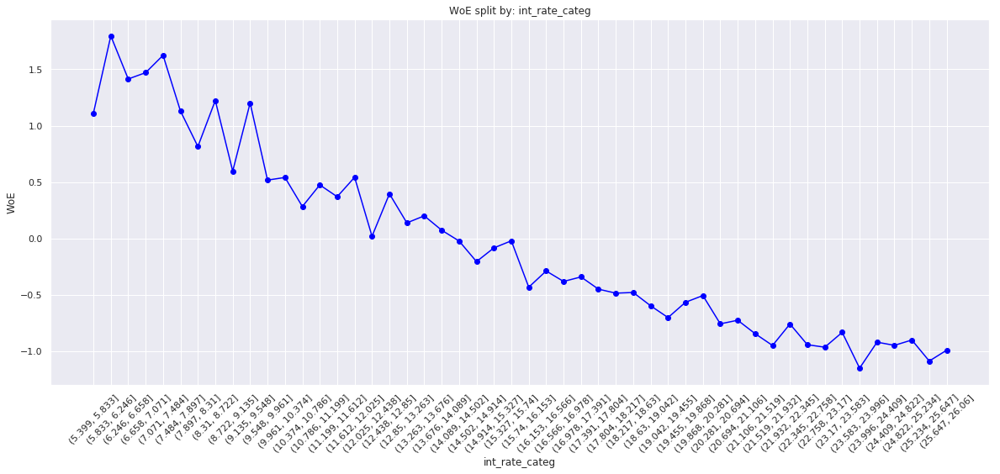

In [127]:
woe_plott(df_temp)

In [128]:
df_in_pp['int_rate:<9.548'] = np.where((df_in_pp['int_rate'] <= 9.548), 1, 0)
df_in_pp['int_rate:9.548-12.025'] = np.where((df_in_pp['int_rate'] > 9.548) & (df_in_pp['int_rate'] <= 12.025), 1, 0)
df_in_pp['int_rate:12.025-15.74'] = np.where((df_in_pp['int_rate'] > 12.025) & (df_in_pp['int_rate'] <= 15.74), 1, 0)
df_in_pp['int_rate:15.74-20.281'] = np.where((df_in_pp['int_rate'] > 15.74) & (df_in_pp['int_rate'] <= 20.281), 1, 0)
df_in_pp['int_rate:>20.281'] = np.where((df_in_pp['int_rate'] > 20.281), 1, 0)

In [129]:
df_in_pp['mths_since_earliest_cr_line_categ'] = pd.cut(df_in_pp['mths_since_earliest_cr_line'], 50)
df_temp = woe_cont(df_in_pp, 'mths_since_earliest_cr_line_categ', df_tgt_pp)
df_temp

,mths_since_earliest_cr_line_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.615, 12.3]",24,1.000000,0.000064,24.0,0.0,0.000072,0.000000,inf
1,"(12.3, 24.6]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
2,"(24.6, 36.9]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
3,"(36.9, 49.2]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
4,"(49.2, 61.5]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
5,"(61.5, 73.8]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
6,"(73.8, 86.1]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
7,"(86.1, 98.4]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
8,"(98.4, 110.7]",722,0.898892,0.001936,649.0,73.0,0.001950,0.001818,0.070238
9,"(110.7, 123.0]",2296,0.879791,0.006155,2020.0,276.0,0.006069,0.006872,-0.124283


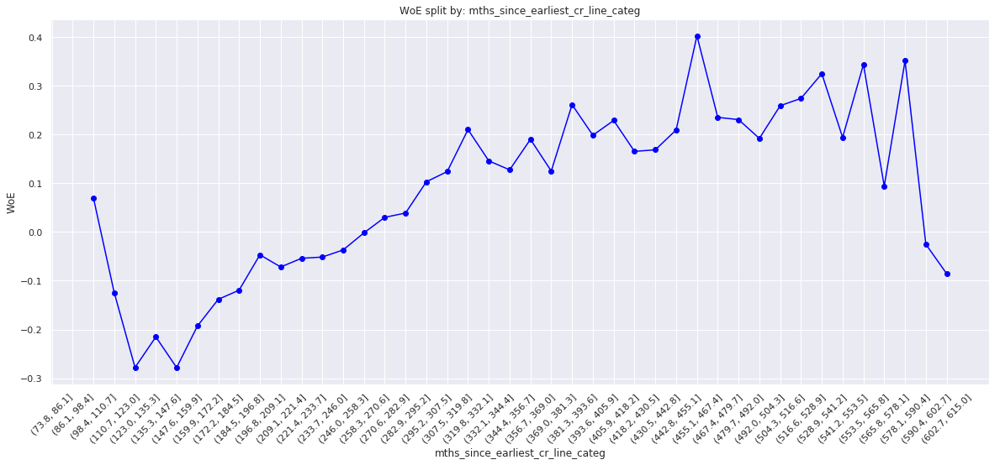

In [130]:
woe_plott(df_temp)


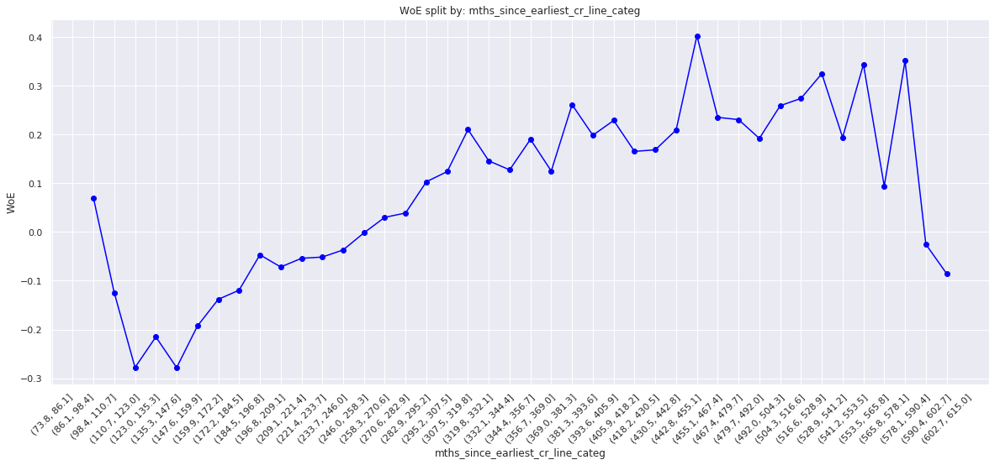

In [131]:
woe_plott(df_temp.iloc[6: , : ])

In [132]:
df_in_pp['mths_since_earliest_cr_line:<140'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(140)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:141-164'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(140, 165)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:165-247'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(165, 248)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:248-270'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(248, 271)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:271-352'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(271, 353)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:>352'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(353, int(df_in_pp['mths_since_earliest_cr_line'].max()))), 1, 0)

In [133]:
df_temp = woe_cont(df_in_pp, 'delinq_2yrs', df_tgt_pp)
df_temp

,delinq_2yrs,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,306417,0.892180,0.821432,273379.0,33038.0,0.821296,0.822557,-0.001534
1,1.0,44927,0.894896,0.120439,40205.0,4722.0,0.120785,0.117565,0.027024
2,2.0,13118,0.890227,0.035166,11678.0,1440.0,0.035084,0.035852,-0.021671
3,3.0,4550,0.884396,0.012197,4024.0,526.0,0.012089,0.013096,-0.080005
4,4.0,1868,0.899893,0.005008,1681.0,187.0,0.005050,0.004656,0.081300
5,5.0,966,0.881988,0.002590,852.0,114.0,0.002560,0.002838,-0.103347
6,6.0,501,0.904192,0.001343,453.0,48.0,0.001361,0.001195,0.129956
7,7.0,279,0.860215,0.000748,240.0,39.0,0.000721,0.000971,-0.297658
8,8.0,148,0.905405,0.000397,134.0,14.0,0.000403,0.000349,0.144047
9,9.0,89,0.887640,0.000239,79.0,10.0,0.000237,0.000249,-0.047872


In [134]:
woe_plot(df_temp)

In [135]:
df_in_pp['delinq_2yrs:0'] = np.where((df_in_pp['delinq_2yrs'] == 0), 1, 0)
df_in_pp['delinq_2yrs:1-3'] = np.where((df_in_pp['delinq_2yrs'] >= 1) & (df_in_pp['delinq_2yrs'] <= 3), 1, 0)
df_in_pp['delinq_2yrs:>=4'] = np.where((df_in_pp['delinq_2yrs'] >= 9), 1, 0)

In [136]:
df_temp = woe_cont(df_in_pp, 'inq_last_6mths', df_tgt_pp)
df_temp

,inq_last_6mths,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,193232,0.908690,0.518009,175588.0,17644.0,0.527508,0.439288,0.183010
1,1.0,104163,0.885478,0.279236,92234.0,11929.0,0.277093,0.297000,-0.069379
2,2.0,46214,0.864846,0.123889,39968.0,6246.0,0.120073,0.155509,-0.258597
3,3.0,20040,0.841218,0.053723,16858.0,3182.0,0.050645,0.079223,-0.447420
4,4.0,5810,0.872117,0.015575,5067.0,743.0,0.015222,0.018499,-0.194927
5,5.0,2217,0.873703,0.005943,1937.0,280.0,0.005819,0.006971,-0.180629
6,6.0,977,0.866940,0.002619,847.0,130.0,0.002545,0.003237,-0.240569
7,7.0,159,0.949686,0.000426,151.0,8.0,0.000454,0.000199,0.823103
8,8.0,101,0.970297,0.000271,98.0,3.0,0.000294,0.000075,1.371620
9,9.0,43,1.000000,0.000115,43.0,0.0,0.000129,0.000000,inf


In [137]:
woe_plot(df_temp)

In [138]:
df_in_pp['inq_last_6mths:0'] = np.where((df_in_pp['inq_last_6mths'] == 0), 1, 0)
df_in_pp['inq_last_6mths:1-2'] = np.where((df_in_pp['inq_last_6mths'] >= 1) & (df_in_pp['inq_last_6mths'] <= 2), 1, 0)
df_in_pp['inq_last_6mths:3-6'] = np.where((df_in_pp['inq_last_6mths'] >= 3) & (df_in_pp['inq_last_6mths'] <= 6), 1, 0)
df_in_pp['inq_last_6mths:>6'] = np.where((df_in_pp['inq_last_6mths'] > 6), 1, 0)

In [139]:
df_temp = woe_cont(df_in_pp, 'open_acc', df_tgt_pp)
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning:

divide by zero encountered in log



,open_acc,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,29,0.862069,0.000078,25.0,4.0,0.000075,0.000100,-0.282154
1,1.0,110,0.936364,0.000295,103.0,7.0,0.000309,0.000174,0.574084
2,2.0,1456,0.859890,0.003903,1252.0,204.0,0.003761,0.005079,-0.300357
3,3.0,4378,0.880082,0.011736,3853.0,525.0,0.011575,0.013071,-0.121526
4,4.0,10028,0.894495,0.026883,8970.0,1058.0,0.026948,0.026341,0.022770
5,5.0,17141,0.893763,0.045951,15320.0,1821.0,0.046025,0.045338,0.015038
6,6.0,24621,0.894440,0.066003,22022.0,2599.0,0.066159,0.064708,0.022180
7,7.0,30169,0.893666,0.080876,26961.0,3208.0,0.080997,0.079871,0.014009
8,8.0,33579,0.892463,0.090017,29968.0,3611.0,0.090031,0.089904,0.001410
9,9.0,35251,0.890301,0.094500,31384.0,3867.0,0.094285,0.096278,-0.020916


In [140]:
woe_plot(df_temp)

In [141]:
woe_plot(df_temp.iloc[ : 40, :])

In [142]:
df_in_pp['open_acc:0'] = np.where((df_in_pp['open_acc'] == 0), 1, 0)
df_in_pp['open_acc:1-3'] = np.where((df_in_pp['open_acc'] >= 1) & (df_in_pp['open_acc'] <= 3), 1, 0)
df_in_pp['open_acc:4-12'] = np.where((df_in_pp['open_acc'] >= 4) & (df_in_pp['open_acc'] <= 12), 1, 0)
df_in_pp['open_acc:13-17'] = np.where((df_in_pp['open_acc'] >= 13) & (df_in_pp['open_acc'] <= 17), 1, 0)
df_in_pp['open_acc:18-22'] = np.where((df_in_pp['open_acc'] >= 18) & (df_in_pp['open_acc'] <= 22), 1, 0)
df_in_pp['open_acc:23-25'] = np.where((df_in_pp['open_acc'] >= 23) & (df_in_pp['open_acc'] <= 25), 1, 0)
df_in_pp['open_acc:26-30'] = np.where((df_in_pp['open_acc'] >= 26) & (df_in_pp['open_acc'] <= 30), 1, 0)
df_in_pp['open_acc:>=31'] = np.where((df_in_pp['open_acc'] >= 31), 1, 0)

In [143]:
df_temp = woe_cont(df_in_pp, 'pub_rec', df_tgt_pp)
df_temp

,pub_rec,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,323999,0.891598,0.868565,288877.0,35122.0,0.867856,0.874443,-0.007562
1,1.0,42381,0.895165,0.113613,37938.0,4443.0,0.113975,0.110619,0.029888
2,2.0,4527,0.903689,0.012136,4091.0,436.0,0.012290,0.010855,0.124167
3,3.0,1280,0.920312,0.003431,1178.0,102.0,0.003539,0.002540,0.331866
4,4.0,408,0.924020,0.001094,377.0,31.0,0.001133,0.000772,0.383523
5,5.0,203,0.911330,0.000544,185.0,18.0,0.000556,0.000448,0.215249
6,6.0,117,0.931624,0.000314,109.0,8.0,0.000327,0.000199,0.497171
7,7.0,48,0.958333,0.000129,46.0,2.0,0.000138,0.000050,1.020759
8,8.0,24,1.000000,0.000064,24.0,0.0,0.000072,0.000000,inf
9,9.0,14,0.785714,0.000038,11.0,3.0,0.000033,0.000075,-0.815452


In [144]:
woe_plot(df_temp)

In [145]:
df_in_pp['pub_rec:0-2'] = np.where((df_in_pp['pub_rec'] >= 0) & (df_in_pp['pub_rec'] <= 2), 1, 0)
df_in_pp['pub_rec:3-4'] = np.where((df_in_pp['pub_rec'] >= 3) & (df_in_pp['pub_rec'] <= 4), 1, 0)
df_in_pp['pub_rec:>=5'] = np.where((df_in_pp['pub_rec'] >= 5), 1, 0)

In [146]:
df_in_pp['total_acc_categ'] = pd.cut(df_in_pp['total_acc'], 50)
df_temp = woe_cont(df_in_pp, 'total_acc_categ', df_tgt_pp)
df_temp

,total_acc_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.15, 3.0]",459,0.871460,0.001230,400.0,59.0,0.001202,0.001469,-0.200808
1,"(3.0, 6.0]",6004,0.872252,0.016095,5237.0,767.0,0.015733,0.019096,-0.193718
2,"(6.0, 9.0]",15047,0.877118,0.040337,13198.0,1849.0,0.039650,0.046035,-0.149315
3,"(9.0, 12.0]",25169,0.883070,0.067472,22226.0,2943.0,0.066772,0.073273,-0.092902
4,"(12.0, 15.0]",33651,0.883332,0.090210,29725.0,3926.0,0.089301,0.097747,-0.090368
5,"(15.0, 18.0]",38711,0.888326,0.103775,34388.0,4323.0,0.103310,0.107631,-0.040977
6,"(18.0, 21.0]",40599,0.887288,0.108836,36023.0,4576.0,0.108222,0.113930,-0.051403
7,"(21.0, 24.0]",40163,0.892563,0.107668,35848.0,4315.0,0.107696,0.107432,0.002455
8,"(24.0, 27.0]",36286,0.896544,0.097274,32532.0,3754.0,0.097734,0.093464,0.044667
9,"(27.0, 30.0]",31775,0.900142,0.085181,28602.0,3173.0,0.085927,0.078999,0.084064


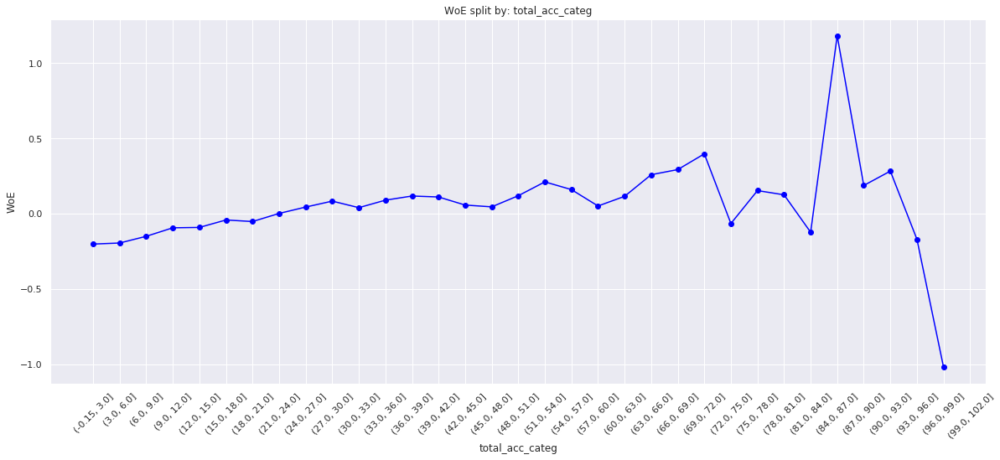

In [147]:
woe_plott(df_temp)

In [148]:
df_in_pp['total_acc:<=27'] = np.where((df_in_pp['total_acc'] <= 27), 1, 0)
df_in_pp['total_acc:28-51'] = np.where((df_in_pp['total_acc'] >= 28) & (df_in_pp['total_acc'] <= 51), 1, 0)
df_in_pp['total_acc:>=52'] = np.where((df_in_pp['total_acc'] >= 52), 1, 0)

In [149]:
df_temp = woe_cont(df_in_pp, 'acc_now_delinq', df_tgt_pp)
df_temp

,acc_now_delinq,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,371682,0.892298,0.996392,331651.0,40031.0,0.996359,0.996664,-0.000306
1,1.0,1263,0.899446,0.003386,1136.0,127.0,0.003413,0.003162,0.076346
2,2.0,70,0.928571,0.000188,65.0,5.0,0.000195,0.000124,0.450214
3,3.0,7,0.857143,0.000019,6.0,1.0,0.000018,0.000025,-0.322976
4,4.0,4,1.000000,0.000011,4.0,0.0,0.000012,0.000000,inf
5,5.0,2,0.500000,0.000005,1.0,1.0,0.000003,0.000025,-2.114735


In [150]:
woe_plot(df_temp)

In [151]:
df_in_pp['acc_now_delinq:0'] = np.where((df_in_pp['acc_now_delinq'] == 0), 1, 0)
df_in_pp['acc_now_delinq:>=1'] = np.where((df_in_pp['acc_now_delinq'] >= 1), 1, 0)

In [152]:
df_in_pp['total_rev_hi_lim_categ'] = pd.cut(df_in_pp['total_rev_hi_lim'], 2000)
df_temp = woe_cont(df_in_pp, 'total_rev_hi_lim_categ', df_tgt_pp)
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning:

divide by zero encountered in log



,total_rev_hi_lim_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-9999.999, 5000.0]",19417,0.874285,0.052052,16976.0,2441.0,0.051000,0.060774,-0.175342
1,"(5000.0, 9999.999]",52655,0.880486,0.141156,46362.0,6293.0,0.139283,0.156679,-0.117693
2,"(9999.999, 14999.998]",59570,0.882458,0.159693,52568.0,7002.0,0.157927,0.174331,-0.098823
3,"(14999.998, 19999.998]",51455,0.878554,0.137939,45206.0,6249.0,0.135810,0.155583,-0.135927
4,"(19999.998, 24999.997]",41582,0.886730,0.111472,36872.0,4710.0,0.110772,0.117266,-0.056970
5,"(24999.997, 29999.997]",32093,0.890101,0.086034,28566.0,3527.0,0.085819,0.087813,-0.022965
6,"(29999.997, 34999.996]",24516,0.894885,0.065722,21939.0,2577.0,0.065910,0.064160,0.026905
7,"(34999.996, 39999.996]",19767,0.903374,0.052991,17857.0,1910.0,0.053647,0.047554,0.120557
8,"(39999.996, 44999.996]",14719,0.914396,0.039458,13459.0,1260.0,0.040434,0.031371,0.253801
9,"(44999.996, 49999.995]",11585,0.911869,0.031057,10564.0,1021.0,0.031737,0.025420,0.221934


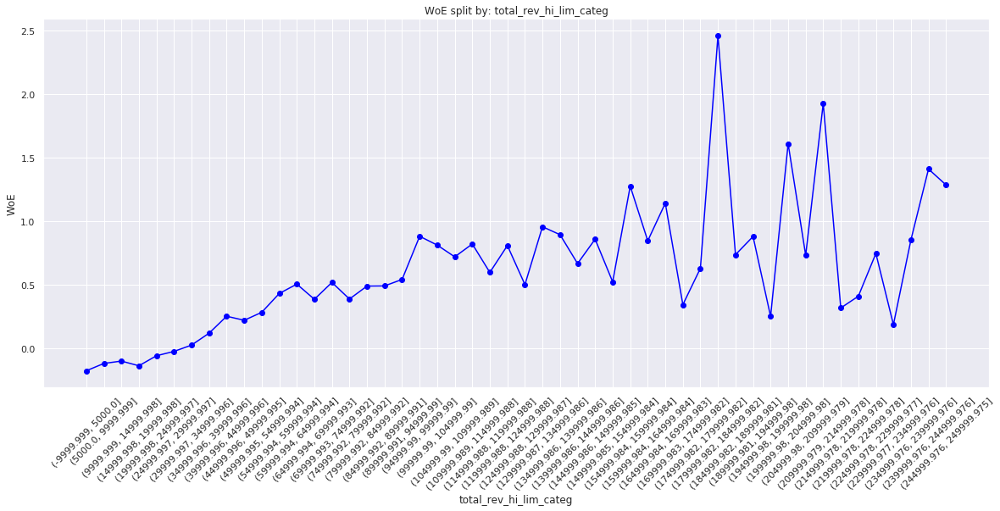

In [153]:
woe_plott(df_temp.iloc[: 50, : ])

In [154]:
df_in_pp['total_rev_hi_lim:<=5K'] = np.where((df_in_pp['total_rev_hi_lim'] <= 5000), 1, 0)
df_in_pp['total_rev_hi_lim:5K-10K'] = np.where((df_in_pp['total_rev_hi_lim'] > 5000) & (df_in_pp['total_rev_hi_lim'] <= 10000), 1, 0)
df_in_pp['total_rev_hi_lim:10K-20K'] = np.where((df_in_pp['total_rev_hi_lim'] > 10000) & (df_in_pp['total_rev_hi_lim'] <= 20000), 1, 0)
df_in_pp['total_rev_hi_lim:20K-30K'] = np.where((df_in_pp['total_rev_hi_lim'] > 20000) & (df_in_pp['total_rev_hi_lim'] <= 30000), 1, 0)
df_in_pp['total_rev_hi_lim:30K-40K'] = np.where((df_in_pp['total_rev_hi_lim'] > 30000) & (df_in_pp['total_rev_hi_lim'] <= 40000), 1, 0)
df_in_pp['total_rev_hi_lim:40K-55K'] = np.where((df_in_pp['total_rev_hi_lim'] > 40000) & (df_in_pp['total_rev_hi_lim'] <= 55000), 1, 0)
df_in_pp['total_rev_hi_lim:55K-95K'] = np.where((df_in_pp['total_rev_hi_lim'] > 55000) & (df_in_pp['total_rev_hi_lim'] <= 95000), 1, 0)
df_in_pp['total_rev_hi_lim:>95K'] = np.where((df_in_pp['total_rev_hi_lim'] > 95000), 1, 0)

In [155]:
df_in_pp['installment_categ'] = pd.cut(df_in_pp['installment'], 50)
df_temp = woe_cont(df_in_pp, 'installment_categ', df_tgt_pp)
df_temp

,installment_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(14.276, 43.556]",1812,0.915011,0.004858,1658.0,154.0,0.004981,0.003834,0.261680
1,"(43.556, 71.443]",4841,0.903945,0.012978,4376.0,465.0,0.013147,0.011577,0.127118
2,"(71.443, 99.329]",6824,0.898154,0.018294,6129.0,695.0,0.018413,0.017304,0.062140
3,"(99.329, 127.216]",9138,0.895601,0.024497,8184.0,954.0,0.024587,0.023752,0.034538
4,"(127.216, 155.102]",10040,0.899303,0.026915,9029.0,1011.0,0.027125,0.025171,0.074767
5,"(155.102, 182.988]",16816,0.897954,0.045080,15100.0,1716.0,0.045364,0.042724,0.059964
6,"(182.988, 210.875]",17216,0.907760,0.046152,15628.0,1588.0,0.046950,0.039537,0.171854
7,"(210.875, 238.761]",15090,0.902319,0.040453,13616.0,1474.0,0.040906,0.036699,0.108531
8,"(238.761, 266.648]",18842,0.903513,0.050511,17024.0,1818.0,0.051144,0.045263,0.122152
9,"(266.648, 294.534]",20100,0.892537,0.053883,17940.0,2160.0,0.053896,0.053778,0.002190


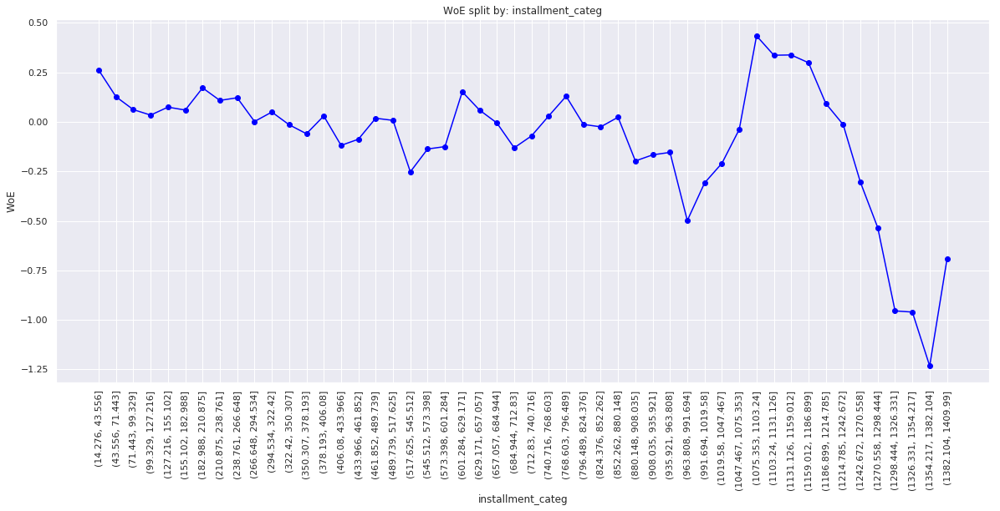

In [156]:
woe_plott(df_temp, 90)

In [157]:
df_in_pp['annual_inc_categ'] = pd.cut(df_in_pp['annual_inc'], 50)
df_temp = woe_cont(df_in_pp, 'annual_inc_categ', df_tgt_pp)
df_temp

,annual_inc_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-5243.882, 144693.64]",351904,0.890163,0.943372,313252.0,38652.0,0.941084,0.962330,-0.022326
1,"(144693.64, 287491.28]",19004,0.927594,0.050945,17628.0,1376.0,0.052959,0.034259,0.435573
2,"(287491.28, 430288.92]",1525,0.935082,0.004088,1426.0,99.0,0.004284,0.002465,0.552774
3,"(430288.92, 573086.56]",332,0.942771,0.000890,313.0,19.0,0.000940,0.000473,0.687029
4,"(573086.56, 715884.2]",112,0.901786,0.000300,101.0,11.0,0.000303,0.000274,0.102490
5,"(715884.2, 858681.84]",65,0.892308,0.000174,58.0,7.0,0.000174,0.000174,-0.000202
6,"(858681.84, 1001479.48]",39,0.974359,0.000105,38.0,1.0,0.000114,0.000025,1.522851
7,"(1001479.48, 1144277.12]",10,1.000000,0.000027,10.0,0.0,0.000030,0.000000,inf
8,"(1144277.12, 1287074.76]",12,1.000000,0.000032,12.0,0.0,0.000036,0.000000,inf
9,"(1287074.76, 1429872.4]",6,1.000000,0.000016,6.0,0.0,0.000018,0.000000,inf


In [158]:
df_in_pp['annual_inc_categ'] = pd.cut(df_in_pp['annual_inc'], 100)
df_temp = woe_cont(df_in_pp, 'annual_inc_categ', df_tgt_pp)
df_temp

,annual_inc_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-5243.882, 73294.82]",231445,0.877768,0.620449,203155.0,28290.0,0.610326,0.704345,-0.143274
1,"(73294.82, 144693.64]",120459,0.913979,0.322922,110097.0,10362.0,0.330758,0.257986,0.248482
2,"(144693.64, 216092.46]",15885,0.926975,0.042584,14725.0,1160.0,0.044237,0.028881,0.426392
3,"(216092.46, 287491.28]",3119,0.930747,0.008361,2903.0,216.0,0.008721,0.005378,0.483487
4,"(287491.28, 358890.1]",1117,0.934646,0.002994,1044.0,73.0,0.003136,0.001818,0.545620
5,"(358890.1, 430288.92]",408,0.936275,0.001094,382.0,26.0,0.001148,0.000647,0.572589
6,"(430288.92, 501687.74]",245,0.951020,0.000657,233.0,12.0,0.000700,0.000299,0.851397
7,"(501687.74, 573086.56]",87,0.919540,0.000233,80.0,7.0,0.000240,0.000174,0.321381
8,"(573086.56, 644485.38]",61,0.885246,0.000164,54.0,7.0,0.000162,0.000174,-0.071661
9,"(644485.38, 715884.2]",51,0.921569,0.000137,47.0,4.0,0.000141,0.000100,0.349118


In [159]:
df_in_pp_temp = df_in_pp.loc[df_in_pp['annual_inc'] <= 140000, : ]

In [160]:
df_in_pp_temp['annual_inc_categ'] = pd.cut(df_in_pp_temp['annual_inc'], 50)
df_temp = woe_cont(df_in_pp_temp, 'annual_inc_categ', df_tgt_pp[df_in_pp_temp.index])
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,annual_inc_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(1757.896, 4658.08]",15,0.933333,0.000040,14.0,1.0,0.000045,0.000026,0.547070
1,"(4658.08, 7420.16]",40,0.875000,0.000107,35.0,5.0,0.000112,0.000130,-0.146077
2,"(7420.16, 10182.24]",287,0.874564,0.000769,251.0,36.0,0.000803,0.000933,-0.150054
3,"(10182.24, 12944.32]",547,0.839122,0.001466,459.0,88.0,0.001469,0.002281,-0.440274
4,"(12944.32, 15706.4]",1210,0.837190,0.003244,1013.0,197.0,0.003242,0.005107,-0.454520
5,"(15706.4, 18468.48]",1522,0.854796,0.004080,1301.0,221.0,0.004163,0.005729,-0.319262
6,"(18468.48, 21230.56]",2928,0.859290,0.007849,2516.0,412.0,0.008052,0.010681,-0.282585
7,"(21230.56, 23992.64]",2495,0.848898,0.006689,2118.0,377.0,0.006778,0.009773,-0.366005
8,"(23992.64, 26754.72]",7016,0.852338,0.018808,5980.0,1036.0,0.019137,0.026857,-0.338934
9,"(26754.72, 29516.8]",5643,0.860890,0.015128,4858.0,785.0,0.015546,0.020350,-0.269289


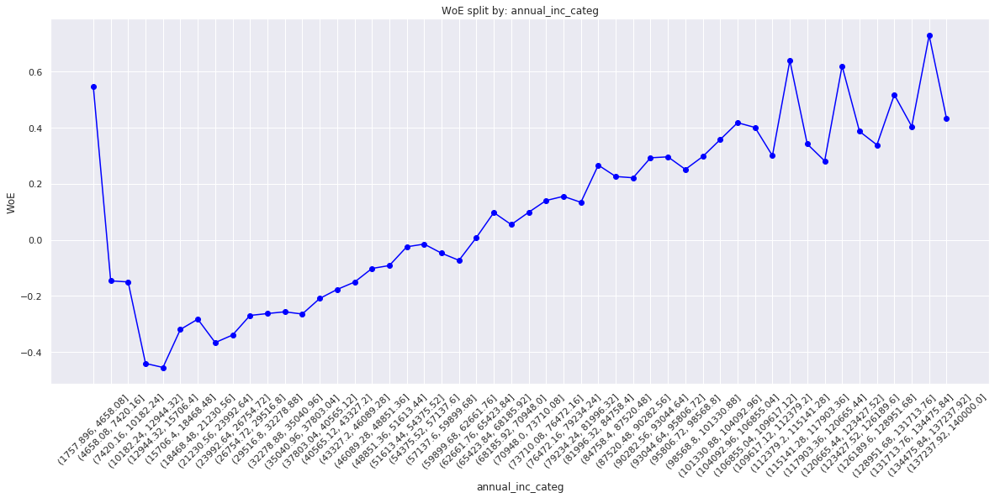

In [161]:
woe_plott(df_temp)

In [162]:
df_in_pp['annual_inc:<20K'] = np.where((df_in_pp['annual_inc'] <= 20000), 1, 0)
df_in_pp['annual_inc:20K-30K'] = np.where((df_in_pp['annual_inc'] > 20000) & (df_in_pp['annual_inc'] <= 30000), 1, 0)
df_in_pp['annual_inc:30K-40K'] = np.where((df_in_pp['annual_inc'] > 30000) & (df_in_pp['annual_inc'] <= 40000), 1, 0)
df_in_pp['annual_inc:40K-50K'] = np.where((df_in_pp['annual_inc'] > 40000) & (df_in_pp['annual_inc'] <= 50000), 1, 0)
df_in_pp['annual_inc:50K-60K'] = np.where((df_in_pp['annual_inc'] > 50000) & (df_in_pp['annual_inc'] <= 60000), 1, 0)
df_in_pp['annual_inc:60K-70K'] = np.where((df_in_pp['annual_inc'] > 60000) & (df_in_pp['annual_inc'] <= 70000), 1, 0)
df_in_pp['annual_inc:70K-80K'] = np.where((df_in_pp['annual_inc'] > 70000) & (df_in_pp['annual_inc'] <= 80000), 1, 0)
df_in_pp['annual_inc:80K-90K'] = np.where((df_in_pp['annual_inc'] > 80000) & (df_in_pp['annual_inc'] <= 90000), 1, 0)
df_in_pp['annual_inc:90K-100K'] = np.where((df_in_pp['annual_inc'] > 90000) & (df_in_pp['annual_inc'] <= 100000), 1, 0)
df_in_pp['annual_inc:100K-120K'] = np.where((df_in_pp['annual_inc'] > 100000) & (df_in_pp['annual_inc'] <= 120000), 1, 0)
df_in_pp['annual_inc:120K-140K'] = np.where((df_in_pp['annual_inc'] > 120000) & (df_in_pp['annual_inc'] <= 140000), 1, 0)
df_in_pp['annual_inc:>140K'] = np.where((df_in_pp['annual_inc'] > 140000), 1, 0)

In [163]:
df_in_pp_temp = df_in_pp[pd.notnull(df_in_pp['mths_since_last_delinq'])]
df_in_pp_temp['mths_since_last_delinq_categ'] = pd.cut(df_in_pp_temp['mths_since_last_delinq'], 50)
df_temp = woe_cont(df_in_pp_temp, 'mths_since_last_delinq_categ', df_tgt_pp[df_in_pp_temp.index])
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,mths_since_last_delinq_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.188, 3.76]",5277,0.894448,0.014146,4720.0,557.0,0.030521,0.030611,-0.002944
1,"(3.76, 7.52]",11167,0.888421,0.029936,9921.0,1246.0,0.064153,0.068477,-0.065228
2,"(7.52, 11.28]",13306,0.894409,0.035670,11901.0,1405.0,0.076956,0.077215,-0.003358
3,"(11.28, 15.04]",13216,0.890209,0.035429,11765.0,1451.0,0.076076,0.079743,-0.047067
4,"(15.04, 18.8]",9337,0.896434,0.025030,8370.0,967.0,0.054123,0.053144,0.018267
5,"(18.8, 22.56]",11641,0.894425,0.031207,10412.0,1229.0,0.067328,0.067542,-0.003185
6,"(22.56, 26.32]",10887,0.897584,0.029185,9772.0,1115.0,0.063189,0.061277,0.030723
7,"(26.32, 30.08]",10560,0.896686,0.028309,9469.0,1091.0,0.061230,0.059958,0.020985
8,"(30.08, 33.84]",7576,0.904171,0.020309,6850.0,726.0,0.044294,0.039899,0.104511
9,"(33.84, 37.6]",9795,0.899541,0.026258,8811.0,984.0,0.056975,0.054078,0.052187


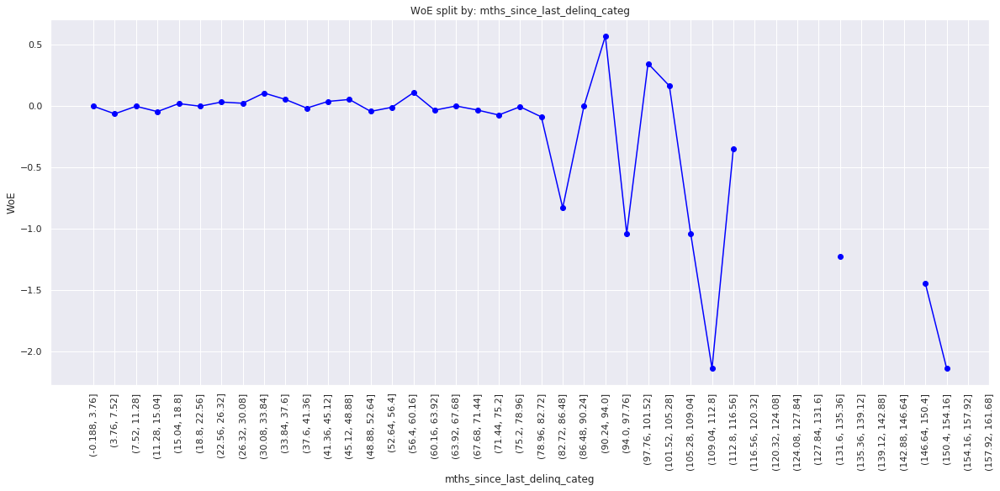

In [164]:
woe_plott(df_temp, 90)

In [165]:
df_in_pp['mths_since_last_delinq:Missing'] = np.where((df_in_pp['mths_since_last_delinq'].isnull()), 1, 0)
df_in_pp['mths_since_last_delinq:0-3'] = np.where((df_in_pp['mths_since_last_delinq'] >= 0) & (df_in_pp['mths_since_last_delinq'] <= 3), 1, 0)
df_in_pp['mths_since_last_delinq:4-30'] = np.where((df_in_pp['mths_since_last_delinq'] >= 4) & (df_in_pp['mths_since_last_delinq'] <= 30), 1, 0)
df_in_pp['mths_since_last_delinq:31-56'] = np.where((df_in_pp['mths_since_last_delinq'] >= 31) & (df_in_pp['mths_since_last_delinq'] <= 56), 1, 0)
df_in_pp['mths_since_last_delinq:>=57'] = np.where((df_in_pp['mths_since_last_delinq'] >= 57), 1, 0)

In [166]:
df_in_pp['dti_categ'] = pd.cut(df_in_pp['dti'], 100)
df_temp = woe_cont(df_in_pp, 'dti_categ', df_tgt_pp)
df_temp

,dti_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.04, 0.4]",745,0.892617,0.001997,665.0,80.0,0.001998,0.001992,0.003025
1,"(0.4, 0.8]",808,0.920792,0.002166,744.0,64.0,0.002235,0.001593,0.338423
2,"(0.8, 1.2]",922,0.902386,0.002472,832.0,90.0,0.002500,0.002241,0.109288
3,"(1.2, 1.6]",1043,0.903164,0.002796,942.0,101.0,0.002830,0.002515,0.118150
4,"(1.6, 2.0]",1172,0.906997,0.003142,1063.0,109.0,0.003194,0.002714,0.162767
5,"(2.0, 2.399]",1337,0.921466,0.003584,1232.0,105.0,0.003701,0.002614,0.347699
6,"(2.399, 2.799]",1538,0.918075,0.004123,1412.0,126.0,0.004242,0.003137,0.301745
7,"(2.799, 3.199]",1696,0.910967,0.004547,1545.0,151.0,0.004642,0.003759,0.210764
8,"(3.199, 3.599]",1927,0.901920,0.005166,1738.0,189.0,0.005221,0.004706,0.104008
9,"(3.599, 3.999]",2197,0.919891,0.005890,2021.0,176.0,0.006072,0.004382,0.326129


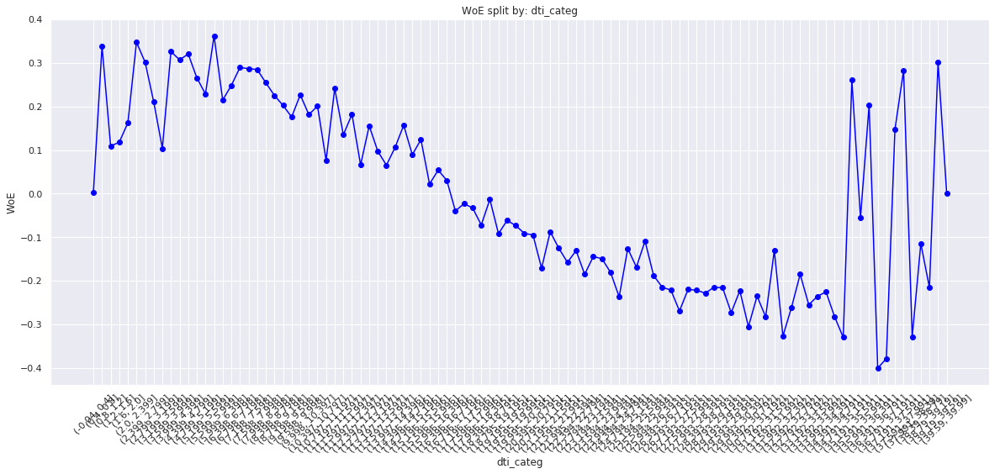

In [167]:
woe_plott(df_temp)

In [168]:
df_in_pp_temp = df_in_pp.loc[df_in_pp['dti'] <= 35, : ]

In [169]:
df_in_pp_temp['dti_categ'] = pd.cut(df_in_pp_temp['dti'], 50)
df_temp = woe_cont(df_in_pp_temp, 'dti_categ', df_tgt_pp[df_in_pp_temp.index])
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,dti_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.035, 0.7]",1366,0.904100,0.003662,1235.0,131.0,0.003739,0.003288,0.128537
1,"(0.7, 1.4]",1664,0.899038,0.004461,1496.0,168.0,0.004529,0.004217,0.071494
2,"(1.4, 2.1]",1986,0.917422,0.005324,1822.0,164.0,0.005516,0.004116,0.292732
3,"(2.1, 2.8]",2594,0.915960,0.006954,2376.0,218.0,0.007193,0.005472,0.273587
4,"(2.8, 3.5]",3135,0.907177,0.008404,2844.0,291.0,0.008610,0.007304,0.164552
5,"(3.5, 4.2]",3844,0.919355,0.010305,3534.0,310.0,0.010699,0.007781,0.318522
6,"(4.2, 4.9]",4595,0.915996,0.012318,4209.0,386.0,0.012743,0.009688,0.274051
7,"(4.9, 5.6]",5312,0.915098,0.014240,4861.0,451.0,0.014717,0.011320,0.262440
8,"(5.6, 6.3]",5927,0.916484,0.015889,5432.0,495.0,0.016445,0.012424,0.280413
9,"(6.3, 7.0]",6482,0.913607,0.017377,5922.0,560.0,0.017929,0.014056,0.243401


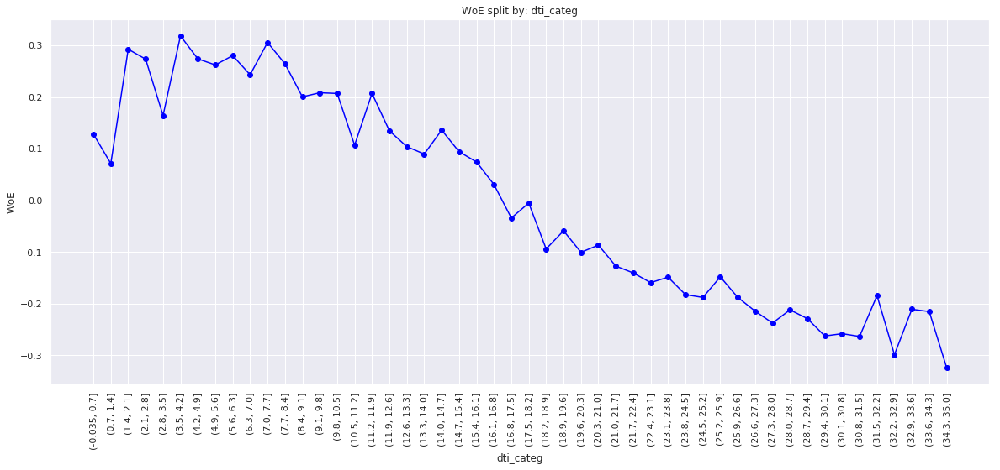

In [170]:
woe_plott(df_temp, 90)

In [171]:
df_in_pp['dti:<=1.4'] = np.where((df_in_pp['dti'] <= 1.4), 1, 0)
df_in_pp['dti:1.4-3.5'] = np.where((df_in_pp['dti'] > 1.4) & (df_in_pp['dti'] <= 3.5), 1, 0)
df_in_pp['dti:3.5-7.7'] = np.where((df_in_pp['dti'] > 3.5) & (df_in_pp['dti'] <= 7.7), 1, 0)
df_in_pp['dti:7.7-10.5'] = np.where((df_in_pp['dti'] > 7.7) & (df_in_pp['dti'] <= 10.5), 1, 0)
df_in_pp['dti:10.5-16.1'] = np.where((df_in_pp['dti'] > 10.5) & (df_in_pp['dti'] <= 16.1), 1, 0)
df_in_pp['dti:16.1-20.3'] = np.where((df_in_pp['dti'] > 16.1) & (df_in_pp['dti'] <= 20.3), 1, 0)
df_in_pp['dti:20.3-21.7'] = np.where((df_in_pp['dti'] > 20.3) & (df_in_pp['dti'] <= 21.7), 1, 0)
df_in_pp['dti:21.7-22.4'] = np.where((df_in_pp['dti'] > 21.7) & (df_in_pp['dti'] <= 22.4), 1, 0)
df_in_pp['dti:22.4-35'] = np.where((df_in_pp['dti'] > 22.4) & (df_in_pp['dti'] <= 35), 1, 0)
df_in_pp['dti:>35'] = np.where((df_in_pp['dti'] > 35), 1, 0)

In [172]:
df_in_pp_temp = df_in_pp[pd.notnull(df_in_pp['mths_since_last_record'])]
df_in_pp_temp['mths_since_last_record_categ'] = pd.cut(df_in_pp_temp['mths_since_last_record'], 50)
df_temp = woe_cont(df_in_pp_temp, 'mths_since_last_record_categ', df_tgt_pp[df_in_pp_temp.index])
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,mths_since_last_record_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.121, 2.42]",1086,0.918969,0.002911,998.0,88.0,0.022207,0.017167,0.257392
1,"(2.42, 4.84]",76,0.894737,0.000204,68.0,8.0,0.001513,0.001561,-0.030959
2,"(4.84, 7.26]",163,0.914110,0.000437,149.0,14.0,0.003315,0.002731,0.193864
3,"(7.26, 9.68]",156,0.903846,0.000418,141.0,15.0,0.003137,0.002926,0.069685
4,"(9.68, 12.1]",292,0.907534,0.000783,265.0,27.0,0.005897,0.005267,0.112868
5,"(12.1, 14.52]",207,0.917874,0.000555,190.0,17.0,0.004228,0.003316,0.242786
6,"(14.52, 16.94]",210,0.928571,0.000563,195.0,15.0,0.004339,0.002926,0.393924
7,"(16.94, 19.36]",334,0.907186,0.000895,303.0,31.0,0.006742,0.006048,0.108721
8,"(19.36, 21.78]",283,0.939929,0.000759,266.0,17.0,0.005919,0.003316,0.579258
9,"(21.78, 24.2]",455,0.898901,0.001220,409.0,46.0,0.009101,0.008974,0.014049


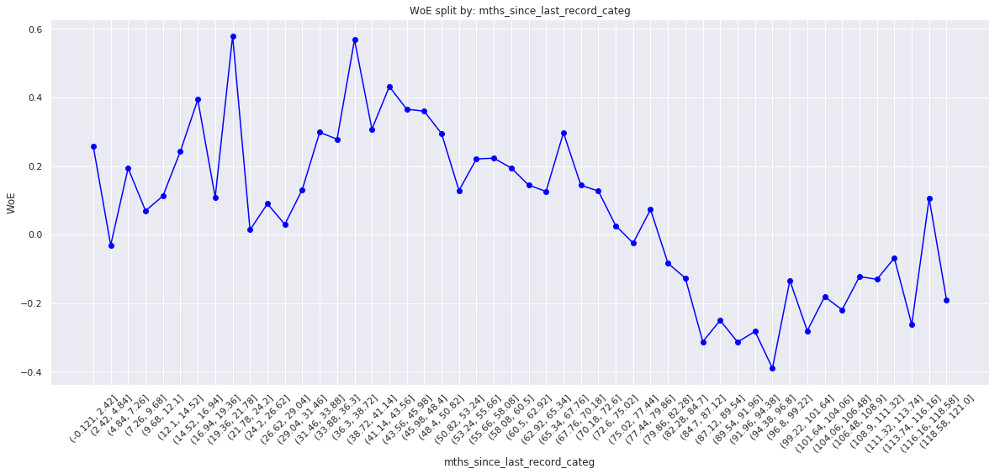

In [173]:
woe_plott(df_temp)

In [174]:
df_in_pp['mths_since_last_record:Missing'] = np.where((df_in_pp['mths_since_last_record'].isnull()), 1, 0)
df_in_pp['mths_since_last_record:0-2'] = np.where((df_in_pp['mths_since_last_record'] >= 0) & (df_in_pp['mths_since_last_record'] <= 2), 1, 0)
df_in_pp['mths_since_last_record:3-20'] = np.where((df_in_pp['mths_since_last_record'] >= 3) & (df_in_pp['mths_since_last_record'] <= 20), 1, 0)
df_in_pp['mths_since_last_record:21-31'] = np.where((df_in_pp['mths_since_last_record'] >= 21) & (df_in_pp['mths_since_last_record'] <= 31), 1, 0)
df_in_pp['mths_since_last_record:32-80'] = np.where((df_in_pp['mths_since_last_record'] >= 32) & (df_in_pp['mths_since_last_record'] <= 80), 1, 0)
df_in_pp['mths_since_last_record:81-86'] = np.where((df_in_pp['mths_since_last_record'] >= 81) & (df_in_pp['mths_since_last_record'] <= 86), 1, 0)
df_in_pp['mths_since_last_record:>=86'] = np.where((df_in_pp['mths_since_last_record'] >= 86), 1, 0)

In [175]:
#######################################################################################################


In [176]:
Data_3_train = df_in_pp

In [177]:
df_in_pp = Data_2_test
df_tgt_pp = data_2_test

In [178]:
df_in_pp['grade'].unique()

array(['C', 'E', 'A', 'D', 'B', 'F', 'G'], dtype=object)

In [179]:
df1 = pd.concat([df_in_pp['grade'], df_tgt_pp], axis =1)
df1

,grade,default_nodefault
362514,C,1
288564,E,1
213591,C,1
263083,C,1
165001,A,1
82511,C,1
24671,D,1
97373,E,1
44058,B,1
351326,B,0


In [180]:
df1 = pd.concat([df1.groupby(by = df1.columns.values[0], as_index=False)[df1.columns.values[1]].count(),
               df1.groupby(by = df1.columns.values[0], as_index=False)[df1.columns.values[1]].mean()], axis=1)

In [181]:
df1 = df1.iloc[:,[0,1,3]]
df1.columns = [df1.columns.values[0],'n','nodefault_prop']
df1['n_prop'] = df1['n']/df1['n'].sum()
df1['n_nodefault'] = df1['nodefault_prop'] * df1['n']
df1['n_default'] = df1['n'] - df1['n_nodefault']
df1['n_nodefault_prop'] = df1['n_nodefault']/df1['n_nodefault'].sum()
df1['n_default_prop'] = df1['n_default']/df1['n_default'].sum()
df1

,grade,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop
0,A,15108,0.962404,0.162004,14540.0,568.0,0.174728,0.056562
1,B,27199,0.923894,0.291656,25129.0,2070.0,0.301977,0.206134
2,C,25048,0.884103,0.268591,22145.0,2903.0,0.266118,0.289086
3,D,15390,0.846394,0.165028,13026.0,2364.0,0.156534,0.235411
4,E,7145,0.808537,0.076616,5777.0,1368.0,0.069423,0.136228
5,F,2699,0.783624,0.028942,2115.0,584.0,0.025416,0.058156
6,G,668,0.723054,0.007163,483.0,185.0,0.005804,0.018423


In [182]:
df1['woe'] = np.log(df1['n_nodefault_prop'] / df1['n_default_prop']) 
df1 = df1.sort_values(by='woe')
df1 = df1.reset_index(drop=True)

In [183]:
df1

,grade,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,G,668,0.723054,0.007163,483.0,185.0,0.005804,0.018423,-1.154990
1,F,2699,0.783624,0.028942,2115.0,584.0,0.025416,0.058156,-0.827742
2,E,7145,0.808537,0.076616,5777.0,1368.0,0.069423,0.136228,-0.674117
3,D,15390,0.846394,0.165028,13026.0,2364.0,0.156534,0.235411,-0.408059
4,C,25048,0.884103,0.268591,22145.0,2903.0,0.266118,0.289086,-0.082784
5,B,27199,0.923894,0.291656,25129.0,2070.0,0.301977,0.206134,0.381823
6,A,15108,0.962404,0.162004,14540.0,568.0,0.174728,0.056562,1.127886


In [184]:
def woe(df, variable_name, tgt_df):
    df = pd.concat([df[variable_name], tgt_df], axis =1)
    df = pd.concat([df.groupby(by = df.columns.values[0], as_index=False)[df.columns.values[1]].count(),
               df.groupby(by = df.columns.values[0], as_index=False)[df.columns.values[1]].mean()], axis=1)
    df = df.iloc[:,[0,1,3]]
    df.columns = [df.columns.values[0],'n','nodefault_prop']
    df['n_prop'] = df['n']/df1['n'].sum()
    df['n_nodefault'] = df['nodefault_prop'] * df['n']
    df['n_default'] = df['n'] - df['n_nodefault']
    df['n_nodefault_prop'] = df['n_nodefault']/df['n_nodefault'].sum()
    df['n_default_prop'] = df['n_default']/df['n_default'].sum()
    df['woe'] = np.log(df['n_nodefault_prop'] / df['n_default_prop']) 
    df = df.sort_values(by='woe')
    df = df.reset_index(drop=True)
    return df
    
            

In [185]:
df_temp = woe(df_in_pp, 'grade', df_tgt_pp)

In [186]:
df_temp

,grade,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,G,668,0.723054,0.007163,483.0,185.0,0.005804,0.018423,-1.154990
1,F,2699,0.783624,0.028942,2115.0,584.0,0.025416,0.058156,-0.827742
2,E,7145,0.808537,0.076616,5777.0,1368.0,0.069423,0.136228,-0.674117
3,D,15390,0.846394,0.165028,13026.0,2364.0,0.156534,0.235411,-0.408059
4,C,25048,0.884103,0.268591,22145.0,2903.0,0.266118,0.289086,-0.082784
5,B,27199,0.923894,0.291656,25129.0,2070.0,0.301977,0.206134,0.381823
6,A,15108,0.962404,0.162004,14540.0,568.0,0.174728,0.056562,1.127886


In [187]:
woe_plot(df_temp)

In [188]:
df_temp = woe(df_in_pp, 'home_ownership', df_tgt_pp)
df_temp

,home_ownership,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,OTHER,45,0.844444,0.000483,38.0,7.0,0.000457,0.000697,-0.422975
1,RENT,37874,0.875719,0.406125,33167.0,4707.0,0.398570,0.468731,-0.162147
2,OWN,8409,0.889404,0.090170,7479.0,930.0,0.089876,0.092611,-0.029982
3,NONE,10,0.900000,0.000107,9.0,1.0,0.000108,0.000100,0.082573
4,MORTGAGE,46919,0.906285,0.503115,42522.0,4397.0,0.510990,0.437861,0.154448


In [189]:
woe_plot(df_temp)

In [190]:
df_in_pp['home_ownership:RENT_OTHER_NONE_ANY'] = sum([df_in_pp['home_ownership:RENT'], df_in_pp['home_ownership:OTHER'],df_in_pp['home_ownership:NONE'], df_in_pp['home_ownership:ANY']])

In [191]:
df_temp = woe(df_in_pp, 'addr_state', df_tgt_pp)

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning:

divide by zero encountered in log



In [192]:
df_temp

,addr_state,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,NE,1,0.000000,0.000011,0.0,1.0,0.000000,0.000100,-inf
1,ID,2,0.500000,0.000021,1.0,1.0,0.000012,0.000100,-2.114651
2,NV,1298,0.858243,0.013919,1114.0,184.0,0.013387,0.018323,-0.313875
3,HI,486,0.860082,0.005211,418.0,68.0,0.005023,0.006772,-0.298678
4,FL,6426,0.872549,0.068906,5607.0,819.0,0.067380,0.081557,-0.190964
5,AL,1182,0.875635,0.012675,1035.0,147.0,0.012438,0.014639,-0.162927
6,LA,1130,0.876991,0.012117,991.0,139.0,0.011909,0.013842,-0.150411
7,NJ,3676,0.878128,0.039418,3228.0,448.0,0.038791,0.044613,-0.139827
8,NY,8031,0.880837,0.086117,7074.0,957.0,0.085009,0.095300,-0.114273
9,RI,403,0.880893,0.004321,355.0,48.0,0.004266,0.004780,-0.113735


In [193]:
woe_plot(df_temp)

In [194]:
woe_plot(df_temp.iloc[5:-21,])

In [195]:
if ['addr_state:ND'] in df_in_pp.columns.values:
    pass
else:
    df_in_pp['addr_state:ND'] = 0

In [196]:
df_in_pp.head(5)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR,term_int,issue_d_date,mths_since_issue_d,recourse:non-recourse,recourse:recourse,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND
362514,362514,19677589,21900299,32500,32500,32500.0,60 months,14.99,773.01,C,C5,Licensed vocational nurse,< 1 year,MORTGAGE,65000.0,Verified,Jul-14,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,home_improvement,Home improvement,950xx,CA,9.32,0.0,Apr-02,0.0,NaN,NaN,7.0,0.0,1208,4.3,20.0,f,0.00,0.00,38213.56000,38213.56,32500.00,5713.56,0.0,0.0,0.0,Oct-15,27391.42,NaN,Oct-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,0.0,6563.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25100.0,NaN,NaN,NaN,0.0,2002-04-01,216.0,CA,non-recourse,60,2014-07-01,69.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [197]:
df_in_pp['addr_state:ND_NE_IA_NV_FL_HI_AL'] = sum([df_in_pp['addr_state:ND'], df_in_pp['addr_state:NE'],
                                                         df_in_pp['addr_state:IA'], df_in_pp['addr_state:NV'],
                                                         df_in_pp['addr_state:FL'], df_in_pp['addr_state:HI'],
                                                         df_in_pp['addr_state:AL']])

df_in_pp['addr_state:NM_VA'] = sum([df_in_pp['addr_state:NM'], df_in_pp['addr_state:VA']])

df_in_pp['addr_state:OK_TN_MO_LA_MD_NC'] = sum([df_in_pp['addr_state:OK'], df_in_pp['addr_state:TN'],
                                              df_in_pp['addr_state:MO'], df_in_pp['addr_state:LA'],
                                              df_in_pp['addr_state:MD'], df_in_pp['addr_state:NC']])

df_in_pp['addr_state:UT_KY_AZ_NJ'] = sum([df_in_pp['addr_state:UT'], df_in_pp['addr_state:KY'],
                                              df_in_pp['addr_state:AZ'], df_in_pp['addr_state:NJ']])

df_in_pp['addr_state:AR_MI_PA_OH_MN'] = sum([df_in_pp['addr_state:AR'], df_in_pp['addr_state:MI'],
                                              df_in_pp['addr_state:PA'], df_in_pp['addr_state:OH'],
                                              df_in_pp['addr_state:MN']])

df_in_pp['addr_state:RI_MA_DE_SD_IN'] = sum([df_in_pp['addr_state:RI'], df_in_pp['addr_state:MA'],
                                              df_in_pp['addr_state:DE'], df_in_pp['addr_state:SD'],
                                              df_in_pp['addr_state:IN']])

df_in_pp['addr_state:GA_WA_OR'] = sum([df_in_pp['addr_state:GA'], df_in_pp['addr_state:WA'],
                                              df_in_pp['addr_state:OR']])

df_in_pp['addr_state:WI_MT'] = sum([df_in_pp['addr_state:WI'], df_in_pp['addr_state:MT']])

df_in_pp['addr_state:IL_CT'] = sum([df_in_pp['addr_state:IL'], df_in_pp['addr_state:CT']])

df_in_pp['addr_state:KS_SC_CO_VT_AK_MS'] = sum([df_in_pp['addr_state:KS'], df_in_pp['addr_state:SC'],
                                              df_in_pp['addr_state:CO'], df_in_pp['addr_state:VT'],
                                              df_in_pp['addr_state:AK'], df_in_pp['addr_state:MS']])

df_in_pp['addr_state:WV_NH_WY_DC_ME_ID'] = sum([df_in_pp['addr_state:WV'], df_in_pp['addr_state:NH'],
                                              df_in_pp['addr_state:WY'], df_in_pp['addr_state:DC'],
                                              df_in_pp['addr_state:ME'], df_in_pp['addr_state:ID']])

In [198]:
df_temp = woe(df_in_pp, 'verification_status', df_tgt_pp)

In [199]:
woe_plot(df_temp)

In [200]:
df_temp = woe(df_in_pp, 'purpose', df_tgt_pp)

In [201]:
woe_plot(df_temp)

In [202]:
df_in_pp['purpose:educ__sm_b__wedd__ren_en__mov__house'] = sum([df_in_pp['purpose:educational'], df_in_pp['purpose:small_business'],
                                                                 df_in_pp['purpose:wedding'], df_in_pp['purpose:renewable_energy'],
                                                                 df_in_pp['purpose:moving'],df_in_pp['purpose:house']])
df_in_pp['purpose:oth__med__vacation'] = sum([df_in_pp['purpose:other'], df_in_pp['purpose:medical'],
                                             df_in_pp['purpose:vacation']])
df_in_pp['purpose:major_purch__car__home_impr'] = sum([df_in_pp['purpose:major_purchase'], df_in_pp['purpose:car'],
                                                        df_in_pp['purpose:home_improvement']])

In [203]:
df_temp = woe(df_in_pp, 'initial_list_status', df_tgt_pp)

In [204]:
woe_plot(df_temp)

In [205]:
def woe_cont(df, variable_name, tgt_df):
    df = pd.concat([df[variable_name], tgt_df], axis =1)
    df = pd.concat([df.groupby(by = df.columns.values[0], as_index=False)[df.columns.values[1]].count(),
               df.groupby(by = df.columns.values[0], as_index=False)[df.columns.values[1]].mean()], axis=1)
    df = df.iloc[:,[0,1,3]]
    df.columns = [df.columns.values[0],'n','nodefault_prop']
    df['n_prop'] = df['n']/df1['n'].sum()
    df['n_nodefault'] = df['nodefault_prop'] * df['n']
    df['n_default'] = df['n'] - df['n_nodefault']
    df['n_nodefault_prop'] = df['n_nodefault']/df['n_nodefault'].sum()
    df['n_default_prop'] = df['n_default']/df['n_default'].sum()
    df['woe'] = np.log(df['n_nodefault_prop'] / df['n_default_prop']) 
    return df
    

In [206]:
df_in_pp['term_int'].unique()

array([60, 36])

In [207]:
df_temp = woe_cont(df_in_pp,'term_int', df_tgt_pp)
df_temp

,term_int,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,36,67534,0.904522,0.724171,61086.0,6448.0,0.734074,0.642103,0.133861
1,60,25723,0.860281,0.275829,22129.0,3594.0,0.265926,0.357897,-0.297028


In [208]:
woe_plot(df_temp)

In [209]:
df_in_pp['term:short'] = np.where((df_in_pp['term_int'] == 36),1,0)
df_in_pp['term:long'] = np.where((df_in_pp['term_int'] == 60),1,0)

In [210]:
df_in_pp.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR,term_int,issue_d_date,mths_since_issue_d,recourse:non-recourse,recourse:recourse,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,term:short,term:long
362514,362514,19677589,21900299,32500,32500,32500.0,60 months,14.99,773.01,C,C5,Licensed vocational nurse,< 1 year,MORTGAGE,65000.0,Verified,Jul-14,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,home_improvement,Home improvement,950xx,CA,9.32,0.0,Apr-02,0.0,NaN,NaN,7.0,0.0,1208,4.3,20.0,f,0.00,0.00,38213.56000,38213.56,32500.00,5713.56,0.0,0.0,0.0,Oct-15,27391.42,NaN,Oc

In [211]:
df_in_pp[['term', 'term_int', 'term:short','term:long']]

,term,term_int,term:short,term:long
362514,60 months,60,0,1
288564,60 months,60,0,1
213591,36 months,36,1,0
263083,60 months,60,0,1
165001,36 months,36,1,0
82511,36 months,36,1,0
24671,60 months,60,0,1
97373,60 months,60,0,1
44058,36 months,36,1,0
351326,36 months,36,1,0


In [212]:
df_in_pp['emp_length_int'].unique()

array([ 0., 10.,  1.,  2.,  9.,  3.,  6.,  4.,  7.,  8.,  5.])

In [213]:
df_temp = woe_cont(df_in_pp, 'emp_length_int', df_tgt_pp)
df_temp

,emp_length_int,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,11553,0.876223,0.123883,10123.0,1430.0,0.121649,0.142402,-0.157516
1,1.0,5968,0.896113,0.063995,5348.0,620.0,0.064267,0.061741,0.040107
2,2.0,8295,0.888849,0.088948,7373.0,922.0,0.088602,0.091814,-0.035617
3,3.0,7391,0.891084,0.079254,6586.0,805.0,0.079144,0.080163,-0.012792
4,4.0,5555,0.891449,0.059567,4952.0,603.0,0.059509,0.060048,-0.009022
5,5.0,6172,0.888205,0.066183,5482.0,690.0,0.065878,0.068711,-0.042118
6,6.0,5225,0.881148,0.056028,4604.0,621.0,0.055327,0.061840,-0.111302
7,7.0,5131,0.894562,0.055020,4590.0,541.0,0.055158,0.053874,0.023565
8,8.0,4542,0.891458,0.048704,4049.0,493.0,0.048657,0.049094,-0.008935
9,9.0,3621,0.894504,0.038828,3239.0,382.0,0.038923,0.038040,0.022948


In [214]:
woe_plot(df_temp)

In [215]:
df_in_pp['emp_length:0'] = np.where(df_in_pp['emp_length_int'].isin([0]),1,0)
df_in_pp['emp_length:1'] = np.where(df_in_pp['emp_length_int'].isin([1]),1,0)
df_in_pp['emp_length:2-4'] = np.where(df_in_pp['emp_length_int'].isin(range(2,5)),1,0)
df_in_pp['emp_length:5-6'] = np.where(df_in_pp['emp_length_int'].isin(range(5,7)),1,0)
df_in_pp['emp_length:7-9'] = np.where(df_in_pp['emp_length_int'].isin(range(7,10)),1,0)
df_in_pp['emp_length:10'] = np.where(df_in_pp['emp_length_int'].isin([10]),1,0)

In [216]:
df_in_pp.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR,term_int,issue_d_date,mths_since_issue_d,recourse:non-recourse,recourse:recourse,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,term:short,term:long,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10
362514,362514,19677589,21900299,32500,32500,32500.0,60 months,14.99,773.01,C,C5,Licensed vocational nurse,< 1 year,MORTGAGE,65000.0,Verified,Jul-14,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,home_improvement,Home improvement,950xx,CA,9.32,0.0,Apr-02,0.0,NaN,NaN,7.0,0.0,1208,4.3,20.0

In [217]:
df_in_pp['mths_since_issue_d'].unique()

array([ 69.,  66.,  94.,  65.,  86.,  78., 114.,  79.,  76.,  87., 100.,
       105.,  75.,  74.,  84.,  83., 147.,  91., 130.,  67.,  81.,  68.,
        80.,  71.,  77.,  85.,  73.,  64.,  82., 102.,  72., 101., 131.,
        98., 123., 117.,  96., 110.,  99., 104., 132.,  93., 108., 119.,
       103.,  95.,  70.,  89.,  92.,  88., 113., 116., 138., 124., 106.,
       111.,  97., 118.,  90., 136., 107., 120., 146., 127., 109., 143.,
       125., 142., 144., 128., 121., 145., 134., 152., 129., 153., 115.,
       112., 122., 133., 137., 126., 135., 140., 141., 150., 139., 148.,
       149., 151., 154.])

In [218]:
df_in_pp['mths_since_issue_d_categ'] = pd.cut(df_in_pp['mths_since_issue_d'],bins=50)

In [219]:
df_in_pp[['mths_since_issue_d','mths_since_issue_d_categ' ]]

,mths_since_issue_d,mths_since_issue_d_categ
362514,69.0,"(67.6, 69.4]"
288564,66.0,"(65.8, 67.6]"
213591,94.0,"(92.8, 94.6]"
263083,65.0,"(63.91, 65.8]"
165001,86.0,"(85.6, 87.4]"
82511,78.0,"(76.6, 78.4]"
24671,114.0,"(112.6, 114.4]"
97373,79.0,"(78.4, 80.2]"
44058,76.0,"(74.8, 76.6]"
351326,69.0,"(67.6, 69.4]"


In [220]:
df_temp = woe_cont(df_in_pp, 'mths_since_issue_d_categ', df_tgt_pp)

In [221]:
df_temp

,mths_since_issue_d_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(63.91, 65.8]",7191,0.945766,0.077109,6801.0,390.0,0.081728,0.038837,0.744027
1,"(65.8, 67.6]",9752,0.930373,0.104571,9073.0,679.0,0.109031,0.067616,0.477786
2,"(67.6, 69.4]",9506,0.919945,0.101933,8745.0,761.0,0.105089,0.075782,0.326953
3,"(69.4, 71.2]",7240,0.909116,0.077635,6582.0,658.0,0.079096,0.065525,0.188238
4,"(71.2, 73.0]",7217,0.902868,0.077388,6516.0,701.0,0.078303,0.069807,0.114857
5,"(73.0, 74.8]",3104,0.895296,0.033284,2779.0,325.0,0.033395,0.032364,0.031370
6,"(74.8, 76.6]",6197,0.890269,0.066451,5517.0,680.0,0.066298,0.067716,-0.021155
7,"(76.6, 78.4]",5821,0.885930,0.062419,5157.0,664.0,0.061972,0.066122,-0.064823
8,"(78.4, 80.2]",5021,0.878909,0.053840,4413.0,608.0,0.053031,0.060546,-0.132516
9,"(80.2, 82.0]",4497,0.874138,0.048222,3931.0,566.0,0.047239,0.056363,-0.176596


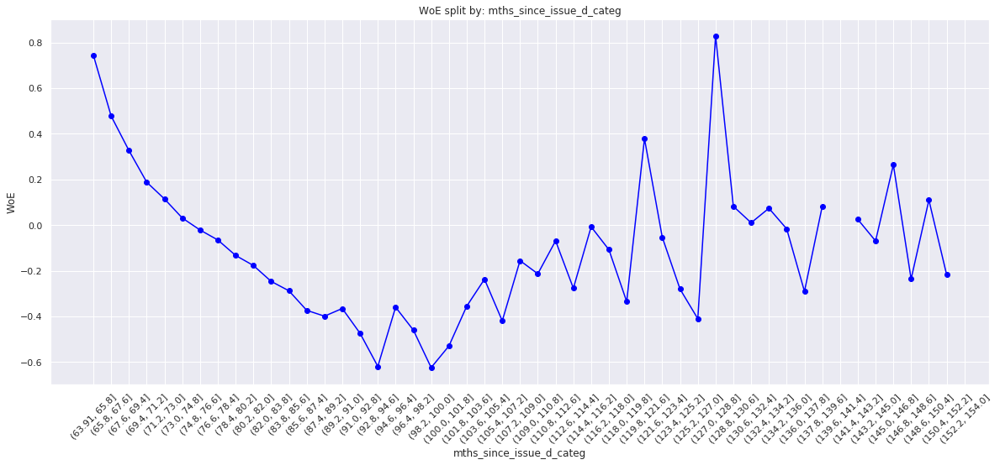

In [222]:
woe_plott(df_temp)

In [223]:
df_in_pp['mths_since_issue_d'].unique()

array([ 69.,  66.,  94.,  65.,  86.,  78., 114.,  79.,  76.,  87., 100.,
       105.,  75.,  74.,  84.,  83., 147.,  91., 130.,  67.,  81.,  68.,
        80.,  71.,  77.,  85.,  73.,  64.,  82., 102.,  72., 101., 131.,
        98., 123., 117.,  96., 110.,  99., 104., 132.,  93., 108., 119.,
       103.,  95.,  70.,  89.,  92.,  88., 113., 116., 138., 124., 106.,
       111.,  97., 118.,  90., 136., 107., 120., 146., 127., 109., 143.,
       125., 142., 144., 128., 121., 145., 134., 152., 129., 153., 115.,
       112., 122., 133., 137., 126., 135., 140., 141., 150., 139., 148.,
       149., 151., 154.])

In [224]:
df_in_pp['mths_since_issue_d:<66'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(66)), 1, 0)
df_in_pp['mths_since_issue_d:66-68'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(66, 69)), 1, 0)
df_in_pp['mths_since_issue_d:69-70'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(69, 71)), 1, 0)
df_in_pp['mths_since_issue_d:71-72'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(71, 73)), 1, 0)
df_in_pp['mths_since_issue_d:73-77'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(73, 78)), 1, 0)
df_in_pp['mths_since_issue_d:78-79'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(78, 80)), 1, 0)
df_in_pp['mths_since_issue_d:80-81'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(80, 82)), 1, 0)
df_in_pp['mths_since_issue_d:>81'] = np.where(df_in_pp['mths_since_issue_d'].isin(range(82, int(df_in_pp['mths_since_issue_d'].max()))), 1, 0)

In [225]:
df_in_pp.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,STATE,R_NR,term_int,issue_d_date,mths_since_issue_d,recourse:non-recourse,recourse:recourse,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,term:short,term:long,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d_categ,mths_since_issue_d:<66,mths_since_issue_d:66-68,mths_since_issue_d:69-70,mths_since_issue_d:71-72,mths_since_issue_d:73-77,mths_since_issue_d:78-79,mths_since_issue_d:80-81,mths_since_issue_d:>81
362514,362514,19677589,21900299,32500,32500,32500.0,60 months,14.99,773.01,C,C5,Licens

In [226]:
df_in_pp['int_rate'].unique()

array([14.99, 20.99, 14.65, 14.49,  8.9 , 16.2 , 15.95, 22.2 , 11.99,
       10.99, 19.05, 11.71, 12.99, 19.99, 14.47, 14.64, 12.12, 10.78,
       18.49, 14.11, 16.29, 17.58, 16.78, 15.99, 20.31, 19.52, 15.22,
       13.98,  7.69, 11.67, 21.15, 16.59, 15.61, 15.31, 13.65, 19.47,
        9.49, 11.14, 17.27, 20.8 , 17.57, 19.72, 13.66, 20.2 , 18.25,
       14.33, 10.64, 14.3 , 18.92, 11.26, 15.81,  6.03, 19.13, 14.35,
        6.62,  7.62, 13.35, 12.68, 13.49, 18.99, 22.9 , 14.09, 23.63,
       10.95, 10.16, 13.11, 10.  , 12.49, 13.68, 22.45, 18.85,  6.49,
       13.67, 15.7 , 17.49, 23.28, 19.69, 18.24,  8.39, 22.4 ,  6.99,
       23.43, 14.16, 17.1 , 15.88, 19.2 ,  6.91,  9.99, 11.55, 17.76,
       21.7 , 13.53,  9.17, 17.14, 20.5 ,  7.49, 14.31, 12.42, 24.08,
       16.49, 12.39, 10.15, 15.21, 24.5 , 25.57, 15.1 , 15.8 , 20.49,
       11.44, 23.7 ,  8.63, 16.99,  7.12, 13.23, 19.24,  9.63, 17.56,
       15.59, 11.83, 13.99,  9.71,  7.9 , 18.75, 22.95,  9.91, 15.96,
        6.17, 16.02,

In [227]:
df_in_pp['int_rate_categ'] = pd.cut(df_in_pp['int_rate'], bins= 50)

In [228]:
df_temp = woe_cont(df_in_pp, 'int_rate_categ', df_tgt_pp)
df_temp

,int_rate_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(5.399, 5.833]",198,0.969697,0.002123,192.0,6.0,0.002307,0.000597,1.351085
1,"(5.833, 6.246]",2086,0.979866,0.022368,2044.0,42.0,0.024563,0.004182,1.770343
2,"(6.246, 6.658]",1974,0.972138,0.021167,1919.0,55.0,0.023061,0.005477,1.437575
3,"(6.658, 7.071]",477,0.951782,0.005115,454.0,23.0,0.005456,0.002290,0.867952
4,"(7.071, 7.484]",804,0.982587,0.008621,790.0,14.0,0.009493,0.001394,1.918324
5,"(7.484, 7.897]",3245,0.965485,0.034796,3133.0,112.0,0.037649,0.011153,1.216596
6,"(7.897, 8.31]",2429,0.951009,0.026046,2310.0,119.0,0.027759,0.011850,0.851228
7,"(8.31, 8.722]",1680,0.966071,0.018015,1623.0,57.0,0.019504,0.005676,1.234329
8,"(8.722, 9.135]",2384,0.942534,0.025564,2247.0,137.0,0.027002,0.013643,0.682719
9,"(9.135, 9.548]",1590,0.976730,0.017050,1553.0,37.0,0.018663,0.003685,1.622375


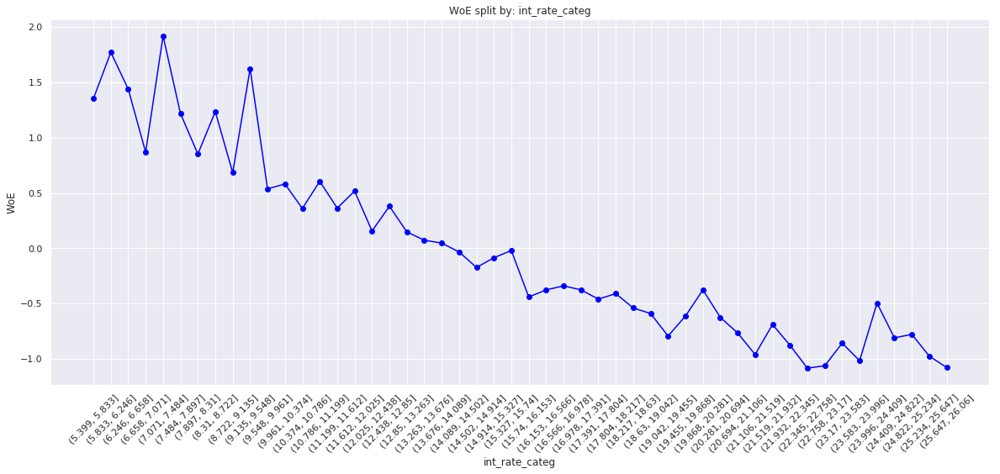

In [229]:
woe_plott(df_temp)

In [230]:
df_in_pp['int_rate:<9.548'] = np.where((df_in_pp['int_rate'] <= 9.548), 1, 0)
df_in_pp['int_rate:9.548-12.025'] = np.where((df_in_pp['int_rate'] > 9.548) & (df_in_pp['int_rate'] <= 12.025), 1, 0)
df_in_pp['int_rate:12.025-15.74'] = np.where((df_in_pp['int_rate'] > 12.025) & (df_in_pp['int_rate'] <= 15.74), 1, 0)
df_in_pp['int_rate:15.74-20.281'] = np.where((df_in_pp['int_rate'] > 15.74) & (df_in_pp['int_rate'] <= 20.281), 1, 0)
df_in_pp['int_rate:>20.281'] = np.where((df_in_pp['int_rate'] > 20.281), 1, 0)

In [231]:
df_in_pp['mths_since_earliest_cr_line_categ'] = pd.cut(df_in_pp['mths_since_earliest_cr_line'], 50)
df_temp = woe_cont(df_in_pp, 'mths_since_earliest_cr_line_categ', df_tgt_pp)
df_temp

,mths_since_earliest_cr_line_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.615, 12.3]",5,1.000000,0.000054,5.0,0.0,0.000060,0.000000,inf
1,"(12.3, 24.6]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
2,"(24.6, 36.9]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
3,"(36.9, 49.2]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
4,"(49.2, 61.5]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
5,"(61.5, 73.8]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
6,"(73.8, 86.1]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
7,"(86.1, 98.4]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
8,"(98.4, 110.7]",182,0.923077,0.001952,168.0,14.0,0.002019,0.001394,0.370255
9,"(110.7, 123.0]",599,0.908180,0.006423,544.0,55.0,0.006537,0.005477,0.176965


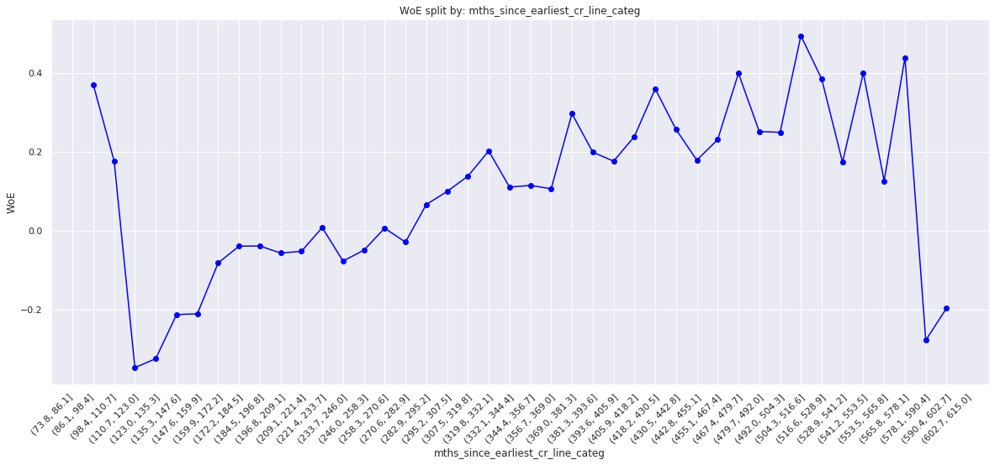

In [232]:
woe_plott(df_temp)


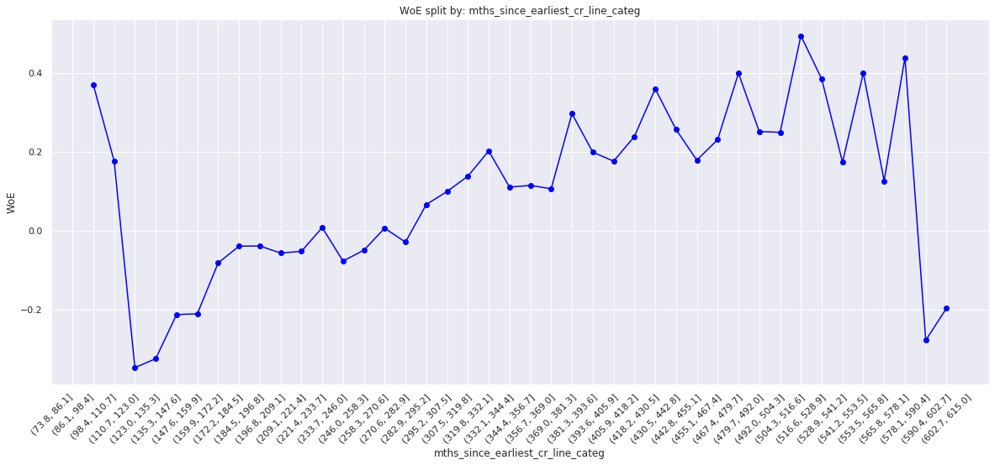

In [233]:
woe_plott(df_temp.iloc[6: , : ])

In [234]:
df_in_pp['mths_since_earliest_cr_line:<140'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(140)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:141-164'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(140, 165)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:165-247'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(165, 248)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:248-270'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(248, 271)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:271-352'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(271, 353)), 1, 0)
df_in_pp['mths_since_earliest_cr_line:>352'] = np.where(df_in_pp['mths_since_earliest_cr_line'].isin(range(353, int(df_in_pp['mths_since_earliest_cr_line'].max()))), 1, 0)

In [235]:
df_temp = woe_cont(df_in_pp, 'delinq_2yrs', df_tgt_pp)
df_temp

,delinq_2yrs,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,76566,0.892642,0.821021,68346.0,8220.0,0.821318,0.818562,0.003362
1,1.0,11297,0.891299,0.121138,10069.0,1228.0,0.121000,0.122286,-0.010577
2,2.0,3192,0.887218,0.034228,2832.0,360.0,0.034032,0.035849,-0.052017
3,3.0,1134,0.893298,0.012160,1013.0,121.0,0.012173,0.012049,0.010230
4,4.0,510,0.888235,0.005469,453.0,57.0,0.005444,0.005676,-0.041810
5,5.0,270,0.911111,0.002895,246.0,24.0,0.002956,0.002390,0.212626
6,6.0,128,0.859375,0.001373,110.0,18.0,0.001322,0.001792,-0.304543
7,7.0,67,0.925373,0.000718,62.0,5.0,0.000745,0.000498,0.403045
8,8.0,29,0.896552,0.000311,26.0,3.0,0.000312,0.000299,0.044833
9,9.0,22,0.954545,0.000236,21.0,1.0,0.000252,0.000100,0.929871


In [236]:
woe_plot(df_temp)

In [237]:
df_in_pp['delinq_2yrs:0'] = np.where((df_in_pp['delinq_2yrs'] == 0), 1, 0)
df_in_pp['delinq_2yrs:1-3'] = np.where((df_in_pp['delinq_2yrs'] >= 1) & (df_in_pp['delinq_2yrs'] <= 3), 1, 0)
df_in_pp['delinq_2yrs:>=4'] = np.where((df_in_pp['delinq_2yrs'] >= 9), 1, 0)

In [238]:
df_temp = woe_cont(df_in_pp, 'inq_last_6mths', df_tgt_pp)
df_temp

,inq_last_6mths,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,48295,0.910260,0.517870,43961.0,4334.0,0.528282,0.431587,0.202161
1,1.0,25985,0.883009,0.278639,22945.0,3040.0,0.275732,0.302729,-0.093409
2,2.0,11611,0.861941,0.124505,10008.0,1603.0,0.120267,0.159630,-0.283143
3,3.0,5086,0.847621,0.054537,4311.0,775.0,0.051806,0.077176,-0.398589
4,4.0,1431,0.869322,0.015345,1244.0,187.0,0.014949,0.018622,-0.219673
5,5.0,551,0.889292,0.005908,490.0,61.0,0.005888,0.006074,-0.031120
6,6.0,211,0.824645,0.002263,174.0,37.0,0.002091,0.003685,-0.566514
7,7.0,36,0.888889,0.000386,32.0,4.0,0.000385,0.000398,-0.035210
8,8.0,21,0.952381,0.000225,20.0,1.0,0.000240,0.000100,0.881081
9,9.0,7,1.000000,0.000075,7.0,0.0,0.000084,0.000000,inf


In [239]:
woe_plot(df_temp)

In [240]:
df_in_pp['inq_last_6mths:0'] = np.where((df_in_pp['inq_last_6mths'] == 0), 1, 0)
df_in_pp['inq_last_6mths:1-2'] = np.where((df_in_pp['inq_last_6mths'] >= 1) & (df_in_pp['inq_last_6mths'] <= 2), 1, 0)
df_in_pp['inq_last_6mths:3-6'] = np.where((df_in_pp['inq_last_6mths'] >= 3) & (df_in_pp['inq_last_6mths'] <= 6), 1, 0)
df_in_pp['inq_last_6mths:>6'] = np.where((df_in_pp['inq_last_6mths'] > 6), 1, 0)

In [241]:
df_temp = woe_cont(df_in_pp, 'open_acc', df_tgt_pp)
df_temp

,open_acc,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,7,1.000000,0.000075,7.0,0.0,0.000084,0.000000,inf
1,1.0,32,0.937500,0.000343,30.0,2.0,0.000361,0.000199,0.593399
2,2.0,334,0.844311,0.003582,282.0,52.0,0.003389,0.005178,-0.423988
3,3.0,1122,0.860071,0.012031,965.0,157.0,0.011596,0.015634,-0.298769
4,4.0,2560,0.896484,0.027451,2295.0,265.0,0.027579,0.026389,0.044107
5,5.0,4403,0.893936,0.047214,3936.0,467.0,0.047299,0.046505,0.016940
6,6.0,6216,0.893018,0.066655,5551.0,665.0,0.066707,0.066222,0.007295
7,7.0,7433,0.888470,0.079704,6604.0,829.0,0.079361,0.082553,-0.039441
8,8.0,8314,0.894756,0.089151,7439.0,875.0,0.089395,0.087134,0.025617
9,9.0,8768,0.889484,0.094020,7799.0,969.0,0.093721,0.096495,-0.029165


In [242]:
woe_plot(df_temp)

In [243]:
woe_plot(df_temp.iloc[ : 40, :])

In [244]:
df_in_pp['open_acc:0'] = np.where((df_in_pp['open_acc'] == 0), 1, 0)
df_in_pp['open_acc:1-3'] = np.where((df_in_pp['open_acc'] >= 1) & (df_in_pp['open_acc'] <= 3), 1, 0)
df_in_pp['open_acc:4-12'] = np.where((df_in_pp['open_acc'] >= 4) & (df_in_pp['open_acc'] <= 12), 1, 0)
df_in_pp['open_acc:13-17'] = np.where((df_in_pp['open_acc'] >= 13) & (df_in_pp['open_acc'] <= 17), 1, 0)
df_in_pp['open_acc:18-22'] = np.where((df_in_pp['open_acc'] >= 18) & (df_in_pp['open_acc'] <= 22), 1, 0)
df_in_pp['open_acc:23-25'] = np.where((df_in_pp['open_acc'] >= 23) & (df_in_pp['open_acc'] <= 25), 1, 0)
df_in_pp['open_acc:26-30'] = np.where((df_in_pp['open_acc'] >= 26) & (df_in_pp['open_acc'] <= 30), 1, 0)
df_in_pp['open_acc:>=31'] = np.where((df_in_pp['open_acc'] >= 31), 1, 0)

In [245]:
df_temp = woe_cont(df_in_pp, 'pub_rec', df_tgt_pp)
df_temp

,pub_rec,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,80923,0.890810,0.867742,72087.0,8836.0,0.866274,0.879904,-0.015612
1,1.0,10670,0.902624,0.114415,9631.0,1039.0,0.115736,0.103465,0.112077
2,2.0,1097,0.904284,0.011763,992.0,105.0,0.011921,0.010456,0.131111
3,3.0,331,0.900302,0.003549,298.0,33.0,0.003581,0.003286,0.085935
4,4.0,112,0.857143,0.001201,96.0,16.0,0.001154,0.001593,-0.322892
5,5.0,73,0.904110,0.000783,66.0,7.0,0.000793,0.000697,0.129093
6,6.0,19,0.894737,0.000204,17.0,2.0,0.000204,0.000199,0.025415
7,7.0,14,0.785714,0.000150,11.0,3.0,0.000132,0.000299,-0.815368
8,8.0,5,0.800000,0.000054,4.0,1.0,0.000048,0.000100,-0.728357
9,9.0,2,1.000000,0.000021,2.0,0.0,0.000024,0.000000,inf


In [246]:
woe_plot(df_temp)

In [247]:
df_in_pp['pub_rec:0-2'] = np.where((df_in_pp['pub_rec'] >= 0) & (df_in_pp['pub_rec'] <= 2), 1, 0)
df_in_pp['pub_rec:3-4'] = np.where((df_in_pp['pub_rec'] >= 3) & (df_in_pp['pub_rec'] <= 4), 1, 0)
df_in_pp['pub_rec:>=5'] = np.where((df_in_pp['pub_rec'] >= 5), 1, 0)

In [248]:
df_in_pp['total_acc_categ'] = pd.cut(df_in_pp['total_acc'], 50)
df_temp = woe_cont(df_in_pp, 'total_acc_categ', df_tgt_pp)
df_temp

,total_acc_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.156, 3.12]",125,0.816000,0.001340,102.0,23.0,0.001226,0.002290,-0.625173
1,"(3.12, 6.24]",1499,0.859907,0.016074,1289.0,210.0,0.015490,0.020912,-0.300137
2,"(6.24, 9.36]",3715,0.874024,0.039836,3247.0,468.0,0.039019,0.046604,-0.177633
3,"(9.36, 12.48]",6288,0.877067,0.067427,5515.0,773.0,0.066274,0.076977,-0.149703
4,"(12.48, 15.6]",8289,0.889733,0.088883,7375.0,914.0,0.088626,0.091018,-0.026631
5,"(15.6, 18.72]",9843,0.891496,0.105547,8775.0,1068.0,0.105450,0.106353,-0.008532
6,"(18.72, 21.84]",10270,0.894937,0.110126,9191.0,1079.0,0.110449,0.107449,0.027539
7,"(21.84, 24.96]",9971,0.894494,0.106920,8919.0,1052.0,0.107180,0.104760,0.022839
8,"(24.96, 28.08]",11873,0.893793,0.127315,10612.0,1261.0,0.127525,0.125573,0.015429
9,"(28.08, 31.2]",7289,0.893127,0.078160,6510.0,779.0,0.078231,0.077574,0.008432


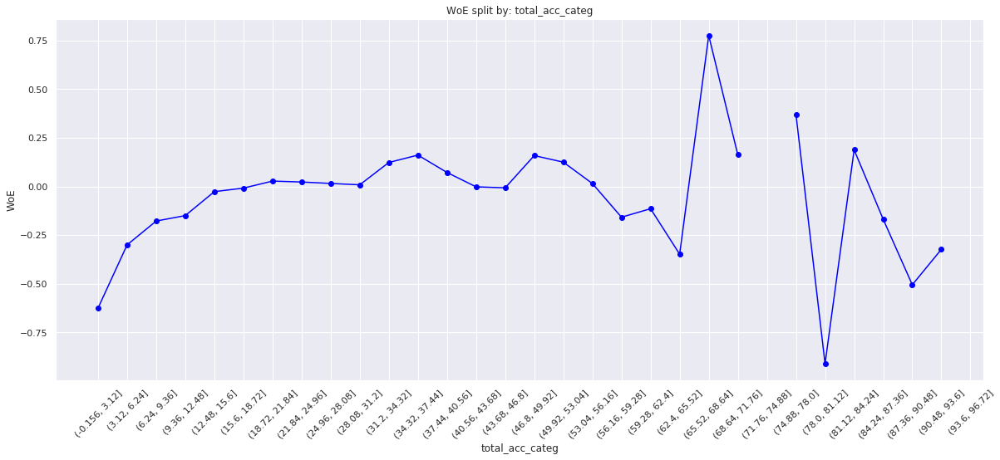

In [249]:
woe_plott(df_temp)

In [250]:
df_in_pp['total_acc:<=27'] = np.where((df_in_pp['total_acc'] <= 27), 1, 0)
df_in_pp['total_acc:28-51'] = np.where((df_in_pp['total_acc'] >= 28) & (df_in_pp['total_acc'] <= 51), 1, 0)
df_in_pp['total_acc:>=52'] = np.where((df_in_pp['total_acc'] >= 52), 1, 0)

In [251]:
df_temp = woe_cont(df_in_pp, 'acc_now_delinq', df_tgt_pp)
df_temp

,acc_now_delinq,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,0.0,92871,0.892421,0.995861,82880.0,9991.0,0.995974,0.994921,0.001058
1,1.0,360,0.872222,0.003860,314.0,46.0,0.003773,0.004581,-0.193900
2,2.0,22,0.818182,0.000236,18.0,4.0,0.000216,0.000398,-0.610574
3,3.0,4,0.750000,0.000043,3.0,1.0,0.000036,0.000100,-1.016039


In [252]:
woe_plot(df_temp)

In [253]:
df_in_pp['acc_now_delinq:0'] = np.where((df_in_pp['acc_now_delinq'] == 0), 1, 0)
df_in_pp['acc_now_delinq:>=1'] = np.where((df_in_pp['acc_now_delinq'] >= 1), 1, 0)

In [254]:
df_in_pp['total_rev_hi_lim_categ'] = pd.cut(df_in_pp['total_rev_hi_lim'], 2000)
df_temp = woe_cont(df_in_pp, 'total_rev_hi_lim_categ', df_tgt_pp)
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning:

divide by zero encountered in log



,total_rev_hi_lim_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-2013.133, 1006.566]",238,0.848739,0.002552,202.0,36.0,0.002427,0.003585,-0.389903
1,"(1006.566, 2013.133]",678,0.834808,0.007270,566.0,112.0,0.006802,0.011153,-0.494556
2,"(2013.133, 3019.7]",1121,0.857270,0.012021,961.0,160.0,0.011548,0.015933,-0.321851
3,"(3019.7, 4026.266]",1461,0.883641,0.015666,1291.0,170.0,0.015514,0.016929,-0.087277
4,"(4026.266, 5032.832]",2163,0.878410,0.023194,1900.0,263.0,0.022832,0.026190,-0.137196
5,"(5032.832, 6039.399]",2411,0.877644,0.025853,2116.0,295.0,0.025428,0.029377,-0.144344
6,"(6039.399, 7045.966]",2376,0.875842,0.025478,2081.0,295.0,0.025008,0.029377,-0.161023
7,"(7045.966, 8052.532]",2825,0.881062,0.030293,2489.0,336.0,0.029910,0.033459,-0.112126
8,"(8052.532, 9059.098]",2686,0.875279,0.028802,2351.0,335.0,0.028252,0.033360,-0.166186
9,"(9059.098, 10065.665]",3514,0.874787,0.037681,3074.0,440.0,0.036940,0.043816,-0.170691


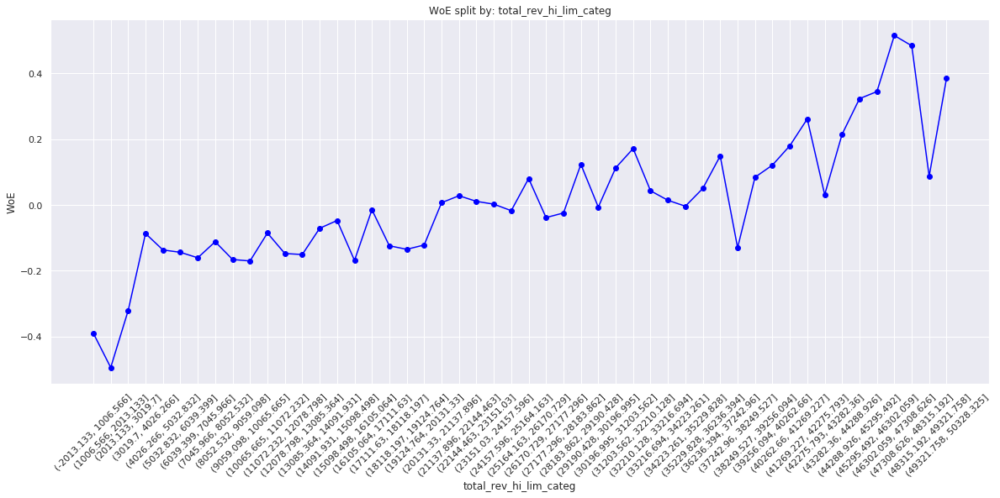

In [255]:
woe_plott(df_temp.iloc[: 50, : ])

In [256]:
df_in_pp['total_rev_hi_lim:<=5K'] = np.where((df_in_pp['total_rev_hi_lim'] <= 5000), 1, 0)
df_in_pp['total_rev_hi_lim:5K-10K'] = np.where((df_in_pp['total_rev_hi_lim'] > 5000) & (df_in_pp['total_rev_hi_lim'] <= 10000), 1, 0)
df_in_pp['total_rev_hi_lim:10K-20K'] = np.where((df_in_pp['total_rev_hi_lim'] > 10000) & (df_in_pp['total_rev_hi_lim'] <= 20000), 1, 0)
df_in_pp['total_rev_hi_lim:20K-30K'] = np.where((df_in_pp['total_rev_hi_lim'] > 20000) & (df_in_pp['total_rev_hi_lim'] <= 30000), 1, 0)
df_in_pp['total_rev_hi_lim:30K-40K'] = np.where((df_in_pp['total_rev_hi_lim'] > 30000) & (df_in_pp['total_rev_hi_lim'] <= 40000), 1, 0)
df_in_pp['total_rev_hi_lim:40K-55K'] = np.where((df_in_pp['total_rev_hi_lim'] > 40000) & (df_in_pp['total_rev_hi_lim'] <= 55000), 1, 0)
df_in_pp['total_rev_hi_lim:55K-95K'] = np.where((df_in_pp['total_rev_hi_lim'] > 55000) & (df_in_pp['total_rev_hi_lim'] <= 95000), 1, 0)
df_in_pp['total_rev_hi_lim:>95K'] = np.where((df_in_pp['total_rev_hi_lim'] > 95000), 1, 0)

In [257]:
df_in_pp['installment_categ'] = pd.cut(df_in_pp['installment'], 50)
df_temp = woe_cont(df_in_pp, 'installment_categ', df_tgt_pp)
df_temp

,installment_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(14.369, 43.585]",485,0.880412,0.005201,427.0,58.0,0.005131,0.005776,-0.118310
1,"(43.585, 71.41]",1246,0.906902,0.013361,1130.0,116.0,0.013579,0.011551,0.161731
2,"(71.41, 99.235]",1731,0.898325,0.018562,1555.0,176.0,0.018687,0.017526,0.064096
3,"(99.235, 127.06]",2292,0.899651,0.024577,2062.0,230.0,0.024779,0.022904,0.078701
4,"(127.06, 154.885]",2602,0.890085,0.027901,2316.0,286.0,0.027832,0.028480,-0.023046
5,"(154.885, 182.71]",4133,0.902492,0.044318,3730.0,403.0,0.044824,0.040131,0.110576
6,"(182.71, 210.535]",4109,0.907033,0.044061,3727.0,382.0,0.044788,0.038040,0.163287
7,"(210.535, 238.36]",3730,0.902949,0.039997,3368.0,362.0,0.040473,0.036049,0.115779
8,"(238.36, 266.185]",4660,0.903219,0.049969,4209.0,451.0,0.050580,0.044911,0.118862
9,"(266.185, 294.01]",4975,0.890050,0.053347,4428.0,547.0,0.053212,0.054471,-0.023397


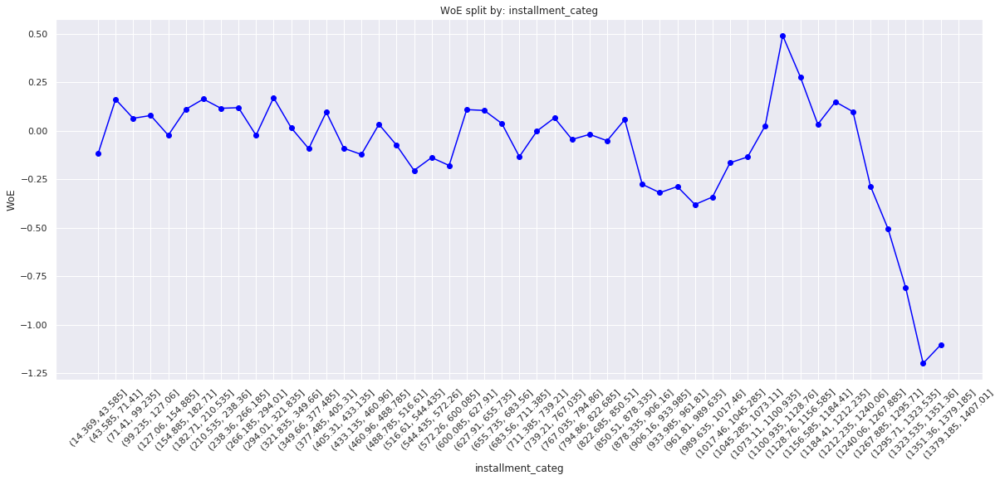

In [258]:
woe_plott(df_temp)

In [259]:
df_in_pp['annual_inc_categ'] = pd.cut(df_in_pp['annual_inc'], 50)
df_temp = woe_cont(df_in_pp, 'annual_inc_categ', df_tgt_pp)
df_temp

,annual_inc_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-2695.2, 154704.0]",89203,0.890598,0.956529,79444.0,9759.0,0.954684,0.971818,-0.017789
1,"(154704.0, 304608.0]",3626,0.929123,0.038882,3369.0,257.0,0.040485,0.025593,0.458644
2,"(304608.0, 454512.0]",282,0.929078,0.003024,262.0,20.0,0.003148,0.001992,0.457961
3,"(454512.0, 604416.0]",86,0.965116,0.000922,83.0,3.0,0.000997,0.000299,1.205577
4,"(604416.0, 754320.0]",23,0.956522,0.000247,22.0,1.0,0.000264,0.000100,0.976391
5,"(754320.0, 904224.0]",18,0.944444,0.000193,17.0,1.0,0.000204,0.000100,0.718562
6,"(904224.0, 1054128.0]",7,1.000000,0.000075,7.0,0.0,0.000084,0.000000,inf
7,"(1054128.0, 1204032.0]",6,1.000000,0.000064,6.0,0.0,0.000072,0.000000,inf
8,"(1204032.0, 1353936.0]",2,0.500000,0.000021,1.0,1.0,0.000012,0.000100,-2.114651
9,"(1353936.0, 1503840.0]",2,1.000000,0.000021,2.0,0.0,0.000024,0.000000,inf


In [260]:
df_in_pp['annual_inc_categ'] = pd.cut(df_in_pp['annual_inc'], 100)
df_temp = woe_cont(df_in_pp, 'annual_inc_categ', df_tgt_pp)
df_temp

,annual_inc_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-2695.2, 79752.0]",62621,0.879673,0.671488,55086.0,7535.0,0.661972,0.750349,-0.125315
1,"(79752.0, 154704.0]",26582,0.916334,0.285040,24358.0,2224.0,0.292712,0.221470,0.278902
2,"(154704.0, 229656.0]",2916,0.928669,0.031268,2708.0,208.0,0.032542,0.020713,0.451776
3,"(229656.0, 304608.0]",710,0.930986,0.007613,661.0,49.0,0.007943,0.004880,0.487282
4,"(304608.0, 379560.0]",171,0.929825,0.001834,159.0,12.0,0.001911,0.001195,0.469346
5,"(379560.0, 454512.0]",111,0.927928,0.001190,103.0,8.0,0.001238,0.000797,0.440636
6,"(454512.0, 529464.0]",53,0.962264,0.000568,51.0,2.0,0.000613,0.000199,1.124027
7,"(529464.0, 604416.0]",33,0.969697,0.000354,32.0,1.0,0.000385,0.000100,1.351085
8,"(604416.0, 679368.0]",10,1.000000,0.000107,10.0,0.0,0.000120,0.000000,inf
9,"(679368.0, 754320.0]",13,0.923077,0.000139,12.0,1.0,0.000144,0.000100,0.370255


In [261]:
df_in_pp_temp = df_in_pp.loc[df_in_pp['annual_inc'] <= 140000, : ]

In [262]:
df_in_pp_temp['annual_inc_categ'] = pd.cut(df_in_pp_temp['annual_inc'], 50)
df_temp = woe_cont(df_in_pp_temp, 'annual_inc_categ', df_tgt_pp[df_in_pp_temp.index])
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,annual_inc_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(4664.8, 7504.0]",10,1.000000,0.000107,10.0,0.0,0.000128,0.000000,inf
1,"(7504.0, 10208.0]",84,0.773810,0.000901,65.0,19.0,0.000833,0.001969,-0.860095
2,"(10208.0, 12912.0]",123,0.788618,0.001319,97.0,26.0,0.001243,0.002694,-0.773429
3,"(12912.0, 15616.0]",304,0.861842,0.003260,262.0,42.0,0.003357,0.004351,-0.259369
4,"(15616.0, 18320.0]",383,0.830287,0.004107,318.0,65.0,0.004075,0.006734,-0.502379
5,"(18320.0, 21024.0]",733,0.847203,0.007860,621.0,112.0,0.007958,0.011604,-0.377211
6,"(21024.0, 23728.0]",704,0.849432,0.007549,598.0,106.0,0.007663,0.010982,-0.359892
7,"(23728.0, 26432.0]",1785,0.863866,0.019141,1542.0,243.0,0.019759,0.025176,-0.242269
8,"(26432.0, 29136.0]",1355,0.853875,0.014530,1157.0,198.0,0.014826,0.020514,-0.324725
9,"(29136.0, 31840.0]",2292,0.858202,0.024577,1967.0,325.0,0.025205,0.033672,-0.289604


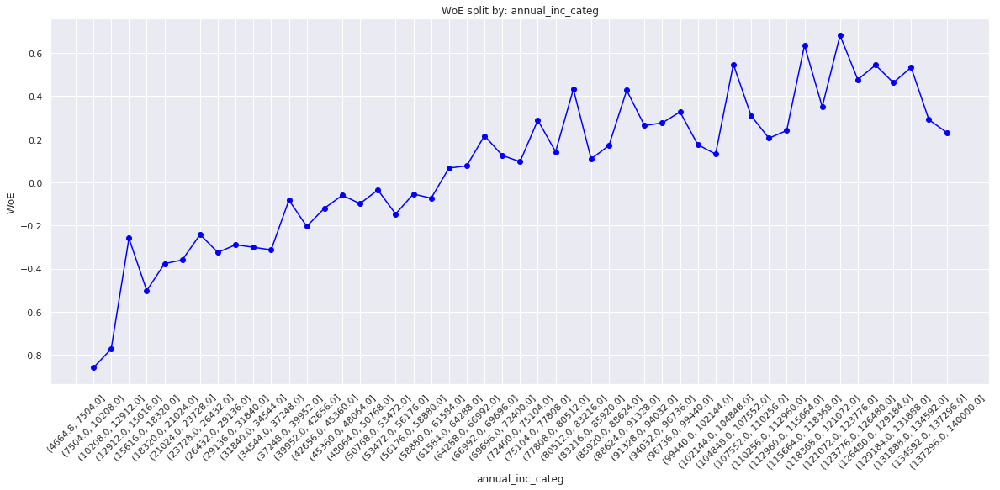

In [263]:
woe_plott(df_temp)

In [264]:
df_in_pp['annual_inc:<20K'] = np.where((df_in_pp['annual_inc'] <= 20000), 1, 0)
df_in_pp['annual_inc:20K-30K'] = np.where((df_in_pp['annual_inc'] > 20000) & (df_in_pp['annual_inc'] <= 30000), 1, 0)
df_in_pp['annual_inc:30K-40K'] = np.where((df_in_pp['annual_inc'] > 30000) & (df_in_pp['annual_inc'] <= 40000), 1, 0)
df_in_pp['annual_inc:40K-50K'] = np.where((df_in_pp['annual_inc'] > 40000) & (df_in_pp['annual_inc'] <= 50000), 1, 0)
df_in_pp['annual_inc:50K-60K'] = np.where((df_in_pp['annual_inc'] > 50000) & (df_in_pp['annual_inc'] <= 60000), 1, 0)
df_in_pp['annual_inc:60K-70K'] = np.where((df_in_pp['annual_inc'] > 60000) & (df_in_pp['annual_inc'] <= 70000), 1, 0)
df_in_pp['annual_inc:70K-80K'] = np.where((df_in_pp['annual_inc'] > 70000) & (df_in_pp['annual_inc'] <= 80000), 1, 0)
df_in_pp['annual_inc:80K-90K'] = np.where((df_in_pp['annual_inc'] > 80000) & (df_in_pp['annual_inc'] <= 90000), 1, 0)
df_in_pp['annual_inc:90K-100K'] = np.where((df_in_pp['annual_inc'] > 90000) & (df_in_pp['annual_inc'] <= 100000), 1, 0)
df_in_pp['annual_inc:100K-120K'] = np.where((df_in_pp['annual_inc'] > 100000) & (df_in_pp['annual_inc'] <= 120000), 1, 0)
df_in_pp['annual_inc:120K-140K'] = np.where((df_in_pp['annual_inc'] > 120000) & (df_in_pp['annual_inc'] <= 140000), 1, 0)
df_in_pp['annual_inc:>140K'] = np.where((df_in_pp['annual_inc'] > 140000), 1, 0)

In [265]:
df_in_pp_temp = df_in_pp[pd.notnull(df_in_pp['mths_since_last_delinq'])]
df_in_pp_temp['mths_since_last_delinq_categ'] = pd.cut(df_in_pp_temp['mths_since_last_delinq'], 50)
df_temp = woe_cont(df_in_pp_temp, 'mths_since_last_delinq_categ', df_tgt_pp[df_in_pp_temp.index])
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,mths_since_last_delinq_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.17, 3.4]",1348,0.887982,0.014455,1197.0,151.0,0.031116,0.032670,-0.048731
1,"(3.4, 6.8]",1890,0.882011,0.020267,1667.0,223.0,0.043334,0.048248,-0.107416
2,"(6.8, 10.2]",3373,0.887341,0.036169,2993.0,380.0,0.077803,0.082215,-0.055165
3,"(10.2, 13.6]",2496,0.897035,0.026765,2239.0,257.0,0.058203,0.055604,0.045683
4,"(13.6, 17.0]",3165,0.885308,0.033938,2802.0,363.0,0.072838,0.078537,-0.075339
5,"(17.0, 20.4]",2282,0.894829,0.024470,2042.0,240.0,0.053082,0.051926,0.022021
6,"(20.4, 23.8]",2115,0.898818,0.022679,1901.0,214.0,0.049416,0.046300,0.065134
7,"(23.8, 27.2]",2755,0.896552,0.029542,2470.0,285.0,0.064208,0.061662,0.040459
8,"(27.2, 30.6]",1929,0.897356,0.020685,1731.0,198.0,0.044997,0.042839,0.049162
9,"(30.6, 34.0]",2453,0.892784,0.026304,2190.0,263.0,0.056929,0.056902,0.000478


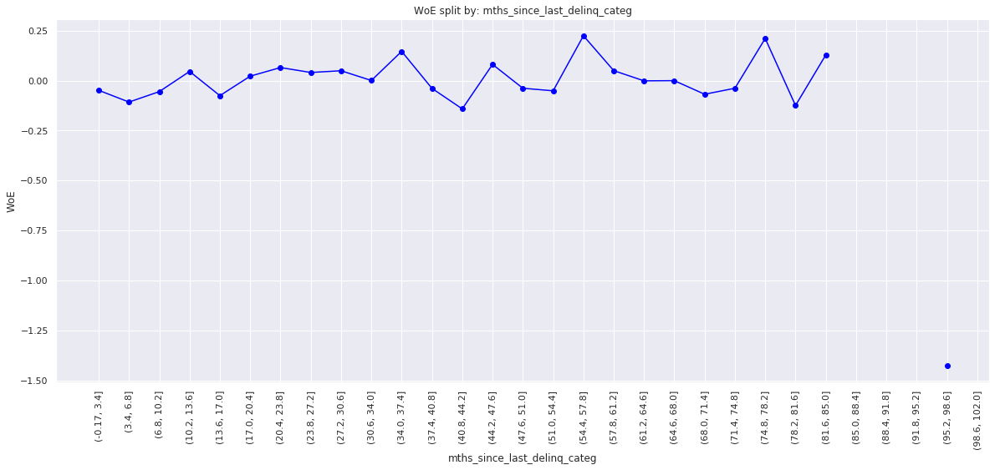

In [266]:
woe_plott(df_temp, 90)

In [267]:
df_in_pp['mths_since_last_delinq:Missing'] = np.where((df_in_pp['mths_since_last_delinq'].isnull()), 1, 0)
df_in_pp['mths_since_last_delinq:0-3'] = np.where((df_in_pp['mths_since_last_delinq'] >= 0) & (df_in_pp['mths_since_last_delinq'] <= 3), 1, 0)
df_in_pp['mths_since_last_delinq:4-30'] = np.where((df_in_pp['mths_since_last_delinq'] >= 4) & (df_in_pp['mths_since_last_delinq'] <= 30), 1, 0)
df_in_pp['mths_since_last_delinq:31-56'] = np.where((df_in_pp['mths_since_last_delinq'] >= 31) & (df_in_pp['mths_since_last_delinq'] <= 56), 1, 0)
df_in_pp['mths_since_last_delinq:>=57'] = np.where((df_in_pp['mths_since_last_delinq'] >= 57), 1, 0)

In [268]:
df_in_pp['dti_categ'] = pd.cut(df_in_pp['dti'], 100)
df_temp = woe_cont(df_in_pp, 'dti_categ', df_tgt_pp)
df_temp

,dti_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.04, 0.4]",187,0.919786,0.002005,172.0,15.0,0.002067,0.001494,0.324793
1,"(0.4, 0.8]",184,0.885870,0.001973,163.0,21.0,0.001959,0.002091,-0.065424
2,"(0.8, 1.2]",223,0.892377,0.002391,199.0,24.0,0.002391,0.002390,0.000600
3,"(1.2, 1.6]",255,0.913725,0.002734,233.0,22.0,0.002800,0.002191,0.245345
4,"(1.6, 2.0]",315,0.901587,0.003378,284.0,31.0,0.003413,0.003087,0.100336
5,"(2.0, 2.399]",324,0.916667,0.003474,297.0,27.0,0.003569,0.002689,0.283244
6,"(2.399, 2.799]",366,0.918033,0.003925,336.0,30.0,0.004038,0.002987,0.301262
7,"(2.799, 3.199]",442,0.914027,0.004740,404.0,38.0,0.004855,0.003784,0.249177
8,"(3.199, 3.599]",484,0.933884,0.005190,452.0,32.0,0.005432,0.003187,0.533295
9,"(3.599, 3.999]",563,0.909414,0.006037,512.0,51.0,0.006153,0.005079,0.191848


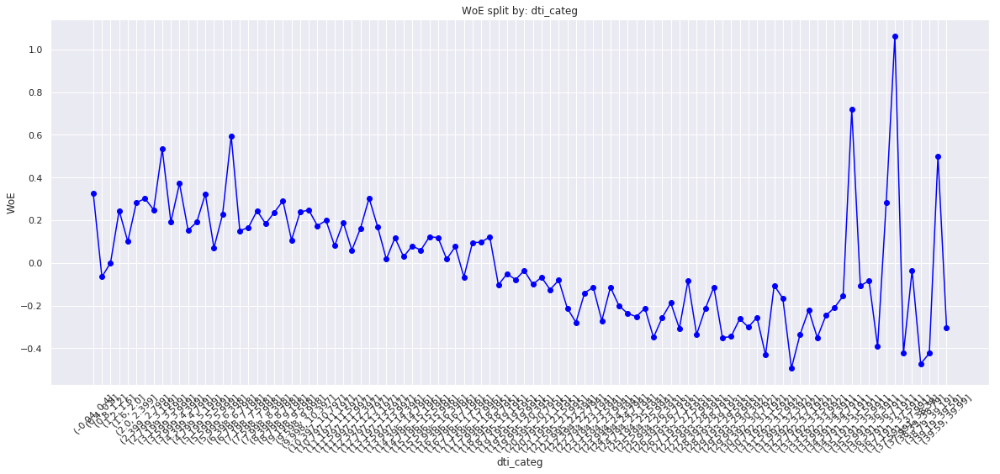

In [269]:
woe_plott(df_temp)

In [270]:
df_in_pp_temp = df_in_pp.loc[df_in_pp['dti'] <= 35, : ]

In [271]:
df_in_pp_temp['dti_categ'] = pd.cut(df_in_pp_temp['dti'], 50)
df_temp = woe_cont(df_in_pp_temp, 'dti_categ', df_tgt_pp[df_in_pp_temp.index])
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,dti_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.035, 0.7]",328,0.899390,0.003517,295.0,33.0,0.003572,0.003312,0.075630
1,"(0.7, 1.4]",393,0.910941,0.004214,358.0,35.0,0.004335,0.003513,0.210348
2,"(1.4, 2.1]",536,0.901119,0.005748,483.0,53.0,0.005849,0.005319,0.094887
3,"(2.1, 2.8]",607,0.917628,0.006509,557.0,50.0,0.006745,0.005018,0.295705
4,"(2.8, 3.5]",811,0.928483,0.008696,753.0,58.0,0.009118,0.005821,0.448785
5,"(3.5, 4.2]",970,0.909278,0.010401,882.0,88.0,0.010680,0.008832,0.190018
6,"(4.2, 4.9]",1140,0.913158,0.012224,1041.0,99.0,0.012605,0.009936,0.237980
7,"(4.9, 5.6]",1370,0.913869,0.014691,1252.0,118.0,0.015160,0.011843,0.246976
8,"(5.6, 6.3]",1491,0.905433,0.015988,1350.0,141.0,0.016347,0.014151,0.144263
9,"(6.3, 7.0]",1722,0.927410,0.018465,1597.0,125.0,0.019338,0.012545,0.432731


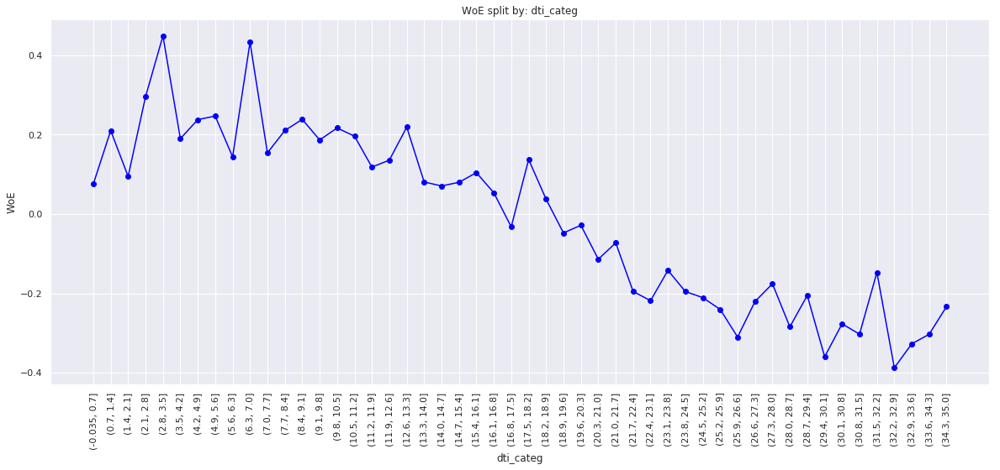

In [272]:
woe_plott(df_temp, 90)

In [273]:
df_in_pp['dti:<=1.4'] = np.where((df_in_pp['dti'] <= 1.4), 1, 0)
df_in_pp['dti:1.4-3.5'] = np.where((df_in_pp['dti'] > 1.4) & (df_in_pp['dti'] <= 3.5), 1, 0)
df_in_pp['dti:3.5-7.7'] = np.where((df_in_pp['dti'] > 3.5) & (df_in_pp['dti'] <= 7.7), 1, 0)
df_in_pp['dti:7.7-10.5'] = np.where((df_in_pp['dti'] > 7.7) & (df_in_pp['dti'] <= 10.5), 1, 0)
df_in_pp['dti:10.5-16.1'] = np.where((df_in_pp['dti'] > 10.5) & (df_in_pp['dti'] <= 16.1), 1, 0)
df_in_pp['dti:16.1-20.3'] = np.where((df_in_pp['dti'] > 16.1) & (df_in_pp['dti'] <= 20.3), 1, 0)
df_in_pp['dti:20.3-21.7'] = np.where((df_in_pp['dti'] > 20.3) & (df_in_pp['dti'] <= 21.7), 1, 0)
df_in_pp['dti:21.7-22.4'] = np.where((df_in_pp['dti'] > 21.7) & (df_in_pp['dti'] <= 22.4), 1, 0)
df_in_pp['dti:22.4-35'] = np.where((df_in_pp['dti'] > 22.4) & (df_in_pp['dti'] <= 35), 1, 0)
df_in_pp['dti:>35'] = np.where((df_in_pp['dti'] > 35), 1, 0)

In [274]:
df_in_pp_temp = df_in_pp[pd.notnull(df_in_pp['mths_since_last_record'])]
df_in_pp_temp['mths_since_last_record_categ'] = pd.cut(df_in_pp_temp['mths_since_last_record'], 50)
df_temp = woe_cont(df_in_pp_temp, 'mths_since_last_record_categ', df_tgt_pp[df_in_pp_temp.index])
df_temp

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning:

divide by zero encountered in log



,mths_since_last_record_categ,n,nodefault_prop,n_prop,n_nodefault,n_default,n_nodefault_prop,n_default_prop,woe
0,"(-0.129, 2.58]",244,0.881148,0.002616,215.0,29.0,0.018964,0.023501,-0.214469
1,"(2.58, 5.16]",36,0.888889,0.000386,32.0,4.0,0.002823,0.003241,-0.138369
2,"(5.16, 7.74]",39,0.923077,0.000418,36.0,3.0,0.003175,0.002431,0.267096
3,"(7.74, 10.32]",66,0.939394,0.000708,62.0,4.0,0.005469,0.003241,0.523029
4,"(10.32, 12.9]",42,0.833333,0.000450,35.0,7.0,0.003087,0.005673,-0.608373
5,"(12.9, 15.48]",69,0.869565,0.000740,60.0,9.0,0.005292,0.007293,-0.320691
6,"(15.48, 18.06]",95,0.873684,0.001019,83.0,12.0,0.007321,0.009724,-0.283877
7,"(18.06, 20.64]",58,0.965517,0.000622,56.0,2.0,0.004940,0.001621,1.114394
8,"(20.64, 23.22]",101,0.891089,0.001083,90.0,11.0,0.007939,0.008914,-0.115896
9,"(23.22, 25.8]",94,0.946809,0.001008,89.0,5.0,0.007850,0.004052,0.661388


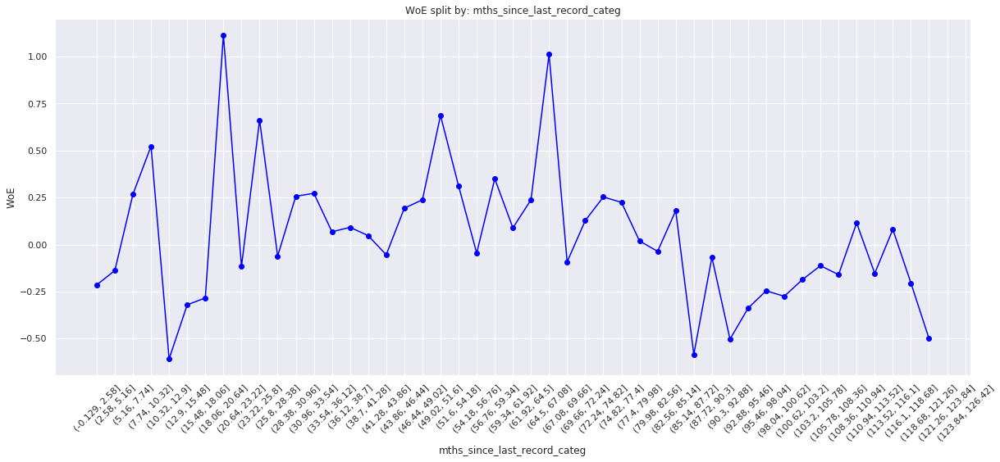

In [275]:
woe_plott(df_temp)

In [276]:
df_in_pp['mths_since_last_record:Missing'] = np.where((df_in_pp['mths_since_last_record'].isnull()), 1, 0)
df_in_pp['mths_since_last_record:0-2'] = np.where((df_in_pp['mths_since_last_record'] >= 0) & (df_in_pp['mths_since_last_record'] <= 2), 1, 0)
df_in_pp['mths_since_last_record:3-20'] = np.where((df_in_pp['mths_since_last_record'] >= 3) & (df_in_pp['mths_since_last_record'] <= 20), 1, 0)
df_in_pp['mths_since_last_record:21-31'] = np.where((df_in_pp['mths_since_last_record'] >= 21) & (df_in_pp['mths_since_last_record'] <= 31), 1, 0)
df_in_pp['mths_since_last_record:32-80'] = np.where((df_in_pp['mths_since_last_record'] >= 32) & (df_in_pp['mths_since_last_record'] <= 80), 1, 0)
df_in_pp['mths_since_last_record:81-86'] = np.where((df_in_pp['mths_since_last_record'] >= 81) & (df_in_pp['mths_since_last_record'] <= 86), 1, 0)
df_in_pp['mths_since_last_record:>=86'] = np.where((df_in_pp['mths_since_last_record'] >= 86), 1, 0)

In [277]:
Data_3_test = df_in_pp

In [278]:
#Data_3_train.to_csv('final_feed_train.csv')
#data_2_train.to_csv('final_target_train.csv')
#Data_3_test.to_csv('final_feed_test.csv')
#data_2_test.to_csv('final_target_test.csv')

In [279]:
print(Data_3_train.shape)
print(data_2_train.shape)
print(Data_3_test.shape)
print(data_2_test.shape)

(373028, 327)
(373028,)
(93257, 327)
(93257,)


In [280]:
Data_3_train.columns.values

array(['Unnamed: 0', 'id', 'member_id', 'loan_amnt', 'funded_amnt',
       'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade',
       'sub_grade', 'emp_title', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status',
       'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'collection_recovery_fee', 'last_pymnt_d',
       'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'mths_since_last_major_derog',
       'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint',
       'veri

In [281]:
feed_train = Data_3_train.loc[:,[
'recourse:non-recourse',
'recourse:recourse',
'grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:NY',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:CA',
'addr_state:UT_KY_AZ_NJ',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:GA_WA_OR',
'addr_state:WI_MT',
'addr_state:TX',
'addr_state:IL_CT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:WV_NH_WY_DC_ME_ID',
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'purpose:credit_card',
'purpose:debt_consolidation',
'purpose:oth__med__vacation',
'purpose:major_purch__car__home_impr',
'initial_list_status:f',
'initial_list_status:w',
'term:short',
'term:long',
'emp_length:0',
'emp_length:1',
'emp_length:2-4',
'emp_length:5-6',
'emp_length:7-9',
'emp_length:10',
'mths_since_issue_d:<66',
'mths_since_issue_d:66-68',
'mths_since_issue_d:69-70',
'mths_since_issue_d:71-72',
'mths_since_issue_d:73-77',
'mths_since_issue_d:78-79',
'mths_since_issue_d:80-81',
'mths_since_issue_d:>81',
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'mths_since_earliest_cr_line:141-164',
'mths_since_earliest_cr_line:165-247',
'mths_since_earliest_cr_line:248-270',
'mths_since_earliest_cr_line:271-352',
'mths_since_earliest_cr_line:>352',
'delinq_2yrs:0',
'delinq_2yrs:1-3',
'delinq_2yrs:>=4',
'inq_last_6mths:0',
'inq_last_6mths:1-2',
'inq_last_6mths:3-6',
'inq_last_6mths:>6',
'open_acc:0',
'open_acc:1-3',
'open_acc:4-12',
'open_acc:13-17',
'open_acc:18-22',
'open_acc:23-25',
'open_acc:26-30',
'open_acc:>=31',
'pub_rec:0-2',
'pub_rec:3-4',
'pub_rec:>=5',
'total_acc:<=27',
'total_acc:28-51',
'total_acc:>=52',
'acc_now_delinq:0',
'acc_now_delinq:>=1',
'total_rev_hi_lim:<=5K',
'total_rev_hi_lim:5K-10K',
'total_rev_hi_lim:10K-20K',
'total_rev_hi_lim:20K-30K',
'total_rev_hi_lim:30K-40K',
'total_rev_hi_lim:40K-55K',
'total_rev_hi_lim:55K-95K',
'total_rev_hi_lim:>95K',
'annual_inc:<20K',
'annual_inc:20K-30K',
'annual_inc:30K-40K',
'annual_inc:40K-50K',
'annual_inc:50K-60K',
'annual_inc:60K-70K',
'annual_inc:70K-80K',
'annual_inc:80K-90K',
'annual_inc:90K-100K',
'annual_inc:100K-120K',
'annual_inc:120K-140K',
'annual_inc:>140K',
'dti:<=1.4',
'dti:1.4-3.5',
'dti:3.5-7.7',
'dti:7.7-10.5',
'dti:10.5-16.1',
'dti:16.1-20.3',
'dti:20.3-21.7',
'dti:21.7-22.4',
'dti:22.4-35',
'dti:>35',
'mths_since_last_delinq:Missing',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'mths_since_last_record:Missing',
'mths_since_last_record:0-2',
'mths_since_last_record:3-20',
'mths_since_last_record:21-31',
'mths_since_last_record:32-80',
'mths_since_last_record:81-86',
'mths_since_last_record:>=86']]

In [282]:
feed_test= Data_3_test.loc[:,[
'recourse:non-recourse',
'recourse:recourse',
'grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:NY',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:CA',
'addr_state:UT_KY_AZ_NJ',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:GA_WA_OR',
'addr_state:WI_MT',
'addr_state:TX',
'addr_state:IL_CT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:WV_NH_WY_DC_ME_ID',
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'purpose:credit_card',
'purpose:debt_consolidation',
'purpose:oth__med__vacation',
'purpose:major_purch__car__home_impr',
'initial_list_status:f',
'initial_list_status:w',
'term:short',
'term:long',
'emp_length:0',
'emp_length:1',
'emp_length:2-4',
'emp_length:5-6',
'emp_length:7-9',
'emp_length:10',
'mths_since_issue_d:<66',
'mths_since_issue_d:66-68',
'mths_since_issue_d:69-70',
'mths_since_issue_d:71-72',
'mths_since_issue_d:73-77',
'mths_since_issue_d:78-79',
'mths_since_issue_d:80-81',
'mths_since_issue_d:>81',
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'mths_since_earliest_cr_line:141-164',
'mths_since_earliest_cr_line:165-247',
'mths_since_earliest_cr_line:248-270',
'mths_since_earliest_cr_line:271-352',
'mths_since_earliest_cr_line:>352',
'delinq_2yrs:0',
'delinq_2yrs:1-3',
'delinq_2yrs:>=4',
'inq_last_6mths:0',
'inq_last_6mths:1-2',
'inq_last_6mths:3-6',
'inq_last_6mths:>6',
'open_acc:0',
'open_acc:1-3',
'open_acc:4-12',
'open_acc:13-17',
'open_acc:18-22',
'open_acc:23-25',
'open_acc:26-30',
'open_acc:>=31',
'pub_rec:0-2',
'pub_rec:3-4',
'pub_rec:>=5',
'total_acc:<=27',
'total_acc:28-51',
'total_acc:>=52',
'acc_now_delinq:0',
'acc_now_delinq:>=1',
'total_rev_hi_lim:<=5K',
'total_rev_hi_lim:5K-10K',
'total_rev_hi_lim:10K-20K',
'total_rev_hi_lim:20K-30K',
'total_rev_hi_lim:30K-40K',
'total_rev_hi_lim:40K-55K',
'total_rev_hi_lim:55K-95K',
'total_rev_hi_lim:>95K',
'annual_inc:<20K',
'annual_inc:20K-30K',
'annual_inc:30K-40K',
'annual_inc:40K-50K',
'annual_inc:50K-60K',
'annual_inc:60K-70K',
'annual_inc:70K-80K',
'annual_inc:80K-90K',
'annual_inc:90K-100K',
'annual_inc:100K-120K',
'annual_inc:120K-140K',
'annual_inc:>140K',
'dti:<=1.4',
'dti:1.4-3.5',
'dti:3.5-7.7',
'dti:7.7-10.5',
'dti:10.5-16.1',
'dti:16.1-20.3',
'dti:20.3-21.7',
'dti:21.7-22.4',
'dti:22.4-35',
'dti:>35',
'mths_since_last_delinq:Missing',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'mths_since_last_record:Missing',
'mths_since_last_record:0-2',
'mths_since_last_record:3-20',
'mths_since_last_record:21-31',
'mths_since_last_record:32-80',
'mths_since_last_record:81-86',
'mths_since_last_record:>=86']]

In [283]:
benchmark = ['recourse:recourse','grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'initial_list_status:f',
'term:long',
'emp_length:0',
'mths_since_issue_d:>81',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'delinq_2yrs:>=4',
'inq_last_6mths:>6',
'open_acc:0',
'pub_rec:0-2',
'total_acc:<=27',
'acc_now_delinq:0',
'total_rev_hi_lim:<=5K',
'annual_inc:<20K',
'dti:>35',
'mths_since_last_delinq:0-3',
'mths_since_last_record:0-2']

In [284]:
feed_train_final = feed_train.drop(benchmark, axis=1)

In [285]:
feed_test_final = feed_test.drop(benchmark, axis=1)

In [286]:
feed_train_target = data_2_train

In [287]:
feed_test_target = data_2_test

In [288]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [289]:
logreg= LogisticRegression()

In [290]:
logreg.fit(feed_train_final, feed_train_target)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [291]:
naming = feed_train_final.columns.values

In [292]:
summary = pd.DataFrame(columns= ['Feature'], data= naming)
summary['Coefficient'] = np.transpose(logreg.coef_)
summary

,Feature,Coefficient
0,recourse:non-recourse,0.007633
1,grade:A,1.001084
2,grade:B,0.790235
3,grade:C,0.605262
4,grade:D,0.432484
5,grade:E,0.287761
6,grade:F,0.114472
7,home_ownership:OWN,0.091558
8,home_ownership:MORTGAGE,0.111321
9,addr_state:NM_VA,0.027447


In [293]:
summary.index = summary.index+1

In [294]:
summary

,Feature,Coefficient
1,recourse:non-recourse,0.007633
2,grade:A,1.001084
3,grade:B,0.790235
4,grade:C,0.605262
5,grade:D,0.432484
6,grade:E,0.287761
7,grade:F,0.114472
8,home_ownership:OWN,0.091558
9,home_ownership:MORTGAGE,0.111321
10,addr_state:NM_VA,0.027447


In [295]:
summary.loc[0] = ['trele', 'morele']

summary

,Feature,Coefficient
1,recourse:non-recourse,0.00763312
2,grade:A,1.00108
3,grade:B,0.790235
4,grade:C,0.605262
5,grade:D,0.432484
6,grade:E,0.287761
7,grade:F,0.114472
8,home_ownership:OWN,0.0915583
9,home_ownership:MORTGAGE,0.111321
10,addr_state:NM_VA,0.0274474


In [296]:
summary = summary.sort_index()
summary

,Feature,Coefficient
0,trele,morele
1,recourse:non-recourse,0.00763312
2,grade:A,1.00108
3,grade:B,0.790235
4,grade:C,0.605262
5,grade:D,0.432484
6,grade:E,0.287761
7,grade:F,0.114472
8,home_ownership:OWN,0.0915583
9,home_ownership:MORTGAGE,0.111321


In [297]:
summary.iloc[0,:] =['Intercept_LogReg', logreg.intercept_[0]]
summary

,Feature,Coefficient
0,Intercept_LogReg,1.33314
1,recourse:non-recourse,0.00763312
2,grade:A,1.00108
3,grade:B,0.790235
4,grade:C,0.605262
5,grade:D,0.432484
6,grade:E,0.287761
7,grade:F,0.114472
8,home_ownership:OWN,0.0915583
9,home_ownership:MORTGAGE,0.111321


In [298]:
y_test = logreg.predict(feed_test_final)
y_test_p = logreg.predict_proba(feed_test_final)

In [299]:
print(y_test)
print(y_test_p)

[1 1 1 ... 1 1 1]
[[0.0830064  0.9169936 ]
 [0.15232032 0.84767968]
 [0.09943416 0.90056584]
 ...
 [0.02395461 0.97604539]
 [0.04253906 0.95746094]
 [0.05658745 0.94341255]]


In [300]:
y_test_p = y_test_p[:][:,1]

In [301]:
y_test_p.shape

(93257,)

In [302]:
copy_feed_test_target = feed_test_target
type(copy_feed_test_target)


pandas.core.series.Series

In [303]:
copy_feed_test_target.reset_index(drop= True, inplace= True)


In [304]:
type(y_test_p.shape)

tuple

In [305]:
actual_vs_predicted_prob = pd.concat([copy_feed_test_target, pd.DataFrame(y_test_p)], axis=1)

In [306]:
actual_vs_predicted_prob.head()

,default_nodefault,0
0,1,0.916994
1,1,0.847680
2,1,0.900566
3,1,0.937617
4,1,0.964776


In [307]:
actual_vs_predicted_prob.columns = ['target', 'probability']
actual_vs_predicted_prob.index = feed_test_final.index

In [308]:
actual_vs_predicted_prob.head(1)

,target,probability
362514,1,0.916994


In [309]:
treshold = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
treshold

[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

In [310]:
for i in treshold:
    actual_vs_predicted_prob[f'target_by_prob_{i}'] =  np.where(actual_vs_predicted_prob['probability']>i,1,0)
actual_vs_predicted_prob

,target,probability,target_by_prob_0.1,target_by_prob_0.2,target_by_prob_0.3,target_by_prob_0.4,target_by_prob_0.5,target_by_prob_0.6,target_by_prob_0.7,target_by_prob_0.8,target_by_prob_0.9
362514,1,0.916994,1,1,1,1,1,1,1,1,1
288564,1,0.847680,1,1,1,1,1,1,1,1,0
213591,1,0.900566,1,1,1,1,1,1,1,1,1
263083,1,0.937617,1,1,1,1,1,1,1,1,1
165001,1,0.964776,1,1,1,1,1,1,1,1,1
82511,1,0.812280,1,1,1,1,1,1,1,1,0
24671,1,0.847901,1,1,1,1,1,1,1,1,0
97373,1,0.735505,1,1,1,1,1,1,1,0,0
44058,1,0.957380,1,1,1,1,1,1,1,1,1
351326,0,0.963503,1,1,1,1,1,1,1,1,1


In [311]:

for i in treshold:
    print(pd.crosstab(actual_vs_predicted_prob['target'],actual_vs_predicted_prob[f'target_by_prob_{i}'],
                                rownames = ['actual'], colnames = ['predicted']))
for i in treshold:
    print(pd.crosstab(actual_vs_predicted_prob['target'],actual_vs_predicted_prob[f'target_by_prob_{i}'],
                                rownames = ['actual'], colnames = ['predicted']))

predicted      1
actual          
0          10042
1          83215
predicted      1
actual          
0          10042
1          83215
predicted      1
actual          
0          10042
1          83215
predicted      1
actual          
0          10042
1          83215
predicted      1
actual          
0          10042
1          83215
predicted   0      1
actual              
0          43   9999
1          53  83162
predicted    0      1
actual               
0          469   9573
1          895  82320
predicted     0      1
actual                
0          2466   7576
1          7426  75789
predicted      0      1
actual                 
0           7168   2874
1          35508  47707
predicted      1
actual          
0          10042
1          83215
predicted      1
actual          
0          10042
1          83215
predicted      1
actual          
0          10042
1          83215
predicted      1
actual          
0          10042
1          83215
predicted      1
actual     

In [312]:
for i in treshold:
    print(pd.crosstab(actual_vs_predicted_prob['target'], actual_vs_predicted_prob[f'target_by_prob_{i}'],
           rownames = ['actual'], colnames = ['predicted']) / actual_vs_predicted_prob.shape[0])

predicted         1
actual             
0          0.107681
1          0.892319
predicted         1
actual             
0          0.107681
1          0.892319
predicted         1
actual             
0          0.107681
1          0.892319
predicted         1
actual             
0          0.107681
1          0.892319
predicted         1
actual             
0          0.107681
1          0.892319
predicted         0         1
actual                       
0          0.000461  0.107220
1          0.000568  0.891751
predicted         0         1
actual                       
0          0.005029  0.102652
1          0.009597  0.882722
predicted         0         1
actual                       
0          0.026443  0.081238
1          0.079629  0.812690
predicted         0         1
actual                       
0          0.076863  0.030818
1          0.380754  0.511565


In [313]:
for i in [0.6,0.7, 0.8, 0.9]:
    j=(pd.crosstab(actual_vs_predicted_prob['target'], actual_vs_predicted_prob[f'target_by_prob_{i}'],
    rownames = ['actual'], colnames = ['predicted']) / actual_vs_predicted_prob.shape[0]).iloc[0, 0] + (pd.crosstab(actual_vs_predicted_prob['target'], actual_vs_predicted_prob[f'target_by_prob_{i}'],
    rownames = ['actual'], colnames = ['predicted']) / actual_vs_predicted_prob.shape[0]).iloc[1, 1]
    print(f' Acurracy for {i} is {j}')
   
    

 Acurracy for 0.6 is 0.892211844687262
 Acurracy for 0.7 is 0.8877510535402169
 Acurracy for 0.8 is 0.8391327192596802
 Acurracy for 0.9 is 0.588427678351223


In [314]:
from sklearn.metrics import roc_curve, roc_auc_score

In [315]:
roc_curve(actual_vs_predicted_prob['target'], actual_vs_predicted_prob['probability'])

(array([0.00000000e+00, 0.00000000e+00, 9.95817566e-05, ...,
        9.99900418e-01, 1.00000000e+00, 1.00000000e+00]),
 array([1.20170642e-05, 2.04290092e-04, 2.04290092e-04, ...,
        9.99975966e-01, 9.99975966e-01, 1.00000000e+00]),
 array([0.99295318, 0.9907613 , 0.99073578, ..., 0.53055976, 0.51172269,
        0.50004135]))

In [316]:
false_positive, true_positive, benchmark = roc_curve(actual_vs_predicted_prob['target'], actual_vs_predicted_prob['probability'])

In [317]:
df_fpr = pd.DataFrame(false_positive, columns=['fpr'],index= None )
df_tpr = pd.DataFrame(true_positive, columns=['tpr'], index=None)

In [318]:
dff = pd.concat([df_fpr, df_tpr], sort= True, axis=1)

In [319]:
dff

,fpr,tpr
0,0.000000,0.000012
1,0.000000,0.000204
2,0.000100,0.000204
3,0.000100,0.000469
4,0.000199,0.000469
5,0.000199,0.001562
6,0.000299,0.001562
7,0.000299,0.007114
8,0.000398,0.007114
9,0.000398,0.008436


In [320]:
fig = go.Figure(data= [go.Line(x= dff['fpr'], y=dff['tpr']),go.Line(x= dff['fpr'], y=dff['fpr'])],
                layout=go.Layout(title={'text':'ROC Curve'}))
fig.show()

/home/kodolamacz/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




In [321]:
AUCROC = roc_auc_score(actual_vs_predicted_prob['target'], actual_vs_predicted_prob['probability'])
AUCROC

0.6982939831521525